In [167]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pickle

import scipy.cluster.hierarchy as sch
from scipy.spatial.distance import pdist

from scipy.spatial.distance import squareform
from scipy.spatial.distance import pdist, jaccard
import scipy.spatial as sp, scipy.cluster.hierarchy as hc
from matplotlib.patches import Rectangle
from scipy.cluster.hierarchy import to_tree, ClusterNode, dendrogram
from typing import Dict, Tuple, List, Union, Optional
from ete3 import Tree
import os

#local
BASE_PATH = "/".join(os.getcwd().split("/")) # base directory level

# DATA_PATH = os.path.join(BASE_PATH, "../../../downloads/")  # where I dump new data
# COMP_PATH = os.path.join(DATA_PATH,"1KGvs1KG")


#Wynton
BIN_PATH = os.path.join(BASE_PATH, "bin")  # where my scripts live
DATA_PATH = os.path.join(BASE_PATH, "data")  # where I dump new data 
RESULTS_PATH = os.path.join(BASE_PATH, "results")  # where I analyze results

SRC_PATH = os.path.join(BASE_PATH, "src")  # where any packages needed to run analyses live. I haven't started structuring things this way yet. 

COMP_PATH = os.path.join(DATA_PATH,"pairwise/hsmrca")
COMP_PATH = os.path.join(DATA_PATH,"pairwise/reference")


In [168]:
import itertools
import json
import pysam


from matplotlib.transforms import Affine2D
import mpl_toolkits.axisartist.floating_axes as floating_axes
from mpl_toolkits.axisartist.grid_finder import DictFormatter
import math

from basenji import dataset, dna_io, seqnn
from scipy import stats

# Functions

In [169]:
def one_window_tree(dict3d, w, tree_summary, tree_complete, link_method, idx):
        window_df = dict_3d[w].loc[idx][idx]
        length = len(idx)
        array = window_df.reindex(index=idx, columns=idx).fillna(0, downcast='infer').to_numpy()
        condensed = array[np.triu_indices(length, k = 1)]
        Z = sch.linkage(condensed, method = link_method)
        dendrogram = sch.dendrogram(Z, labels=idx)
        whole_tree = [Z, dendrogram]

        cluster_sample_IDs = dendrogram['leaves']
        cluster_IDs = dendrogram['leaves_color_list']
        clusters_dict = dict(zip(cluster_sample_IDs, cluster_IDs))

        cluster_IDs_list = []
        for key, value in sorted(clusters_dict.items()):
                cluster_IDs_list.append(value)

        top_tree_y = dendrogram['dcoord'][-1]
        window_stats = cluster_IDs_list + top_tree_y


        return window_stats, whole_tree



In [170]:
def get_col_id(row):
    id_name = row.individual
    print(id_name)
    col_id = int(vcf_index[vcf_index['name']==id_name].index[0]) + 5
    print(id_name)
    print(col_id)
    return int(col_id)

In [171]:
def get_super_pop(idw_row):
    return idw_row.individual.split('_')[0]

In [172]:
def loadAkita():
    os.environ["CUDA_VISIBLE_DEVICES"] = '-1'

    import tensorflow as tf
    if tf.__version__[0] == '1':
        tf.compat.v1.enable_eager_execution()

    with open('/wynton/group/capra/projects/modern_human_3Dgenome/bin/basenji/manuscripts/akita/params.json') as params_file:
        params = json.load(params_file)
        params_model = params['model']
        params_train = params['train']
        
    global seqnn_model
    seqnn_model = seqnn.SeqNN(params_model)
    seqnn_model.restore('/wynton/group/capra/projects/modern_human_3Dgenome/bin/basenji/manuscripts/akita/model_best.h5')

In [173]:
loadAkita()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 sequence (InputLayer)          [(None, 1048576, 4)  0           []                               
                                ]                                                                 
                                                                                                  
 stochastic_reverse_complement_  ((None, 1048576, 4)  0          ['sequence[0][0]']               
 1 (StochasticReverseComplement  , ())                                                            
 )                                                                                                
                                                                                                  
 stochastic_shift_1 (Stochastic  (None, 1048576, 4)  0           ['stochastic_reverse_comple

In [174]:
def runAkitaPreds(seq):
    if len(seq) != 2**20: raise ValueError('len(seq) != seq_length')
    seq_1hot = dna_io.dna_1hot(seq)
    test_pred_from_seq = seqnn_model.model.predict(np.expand_dims(seq_1hot,0))
    return test_pred_from_seq

In [175]:
def comparePreds(ref, alt):
    mse = np.mean(np.square(ref - alt))
    spearman = stats.spearmanr(ref, alt)[0]
    divergence = 1 - spearman
    return (mse, divergence)

In [176]:
def get_contact_maps():
    with open(f'/wynton/group/capra/projects/modern_human_3Dgenome/data/akitaPreds/3dpreds/HFF_original/3dpreds_hg38_reference.txt', 'r') as ref_file:
        for line in ref_file:
            ref_line = line.split('\t')
            if ref_line[0] == chr and ref_line[1] == window_start:
                print(ref_line[0])
                print(ref_line[1])
                ref_pred_hff = list(map(float,ref_line[2:]))

    ref_fasta_open = pysam.Fastafile('/wynton/group/capra/projects/modern_human_3Dgenome/data/genomes/hg38_reference.fa')
    ref_seq = ref_fasta_open.fetch(chr, int(window_start), int(window_start)+2**20).upper()
    pos_in_window = (int(variant_pos)-1)-int(window_start)
    alt_seq = ref_seq[0:pos_in_window] + alt_allele + ref_seq[pos_in_window+1:]
    alt_pred = runAkitaPreds(alt_seq)
    alt_pred_hff = alt_pred[:,:,0][0]
    return ref_pred_hff, alt_pred_hff

In [177]:
def get_contact_maps_custom_seqs(base_seq, chr, window_start, variant_pos, alt_allele):
    base_pred = runAkitaPreds(base_seq)
    base_pred = base_pred[:,:,0][0]
    
    pos_in_window = (int(variant_pos)-1)-int(window_start)
    alt_seq = base_seq[0:pos_in_window] + alt_allele + base_seq[pos_in_window+1:]
    alt_pred = runAkitaPreds(alt_seq)
    alt_pred_hff = alt_pred[:,:,0][0]
    return base_pred, alt_pred_hff

In [178]:
def in_silico_mutagenesis_SNV_test(chromosome,pos,alt,target_window):
    global chr
    chr = chromosome
    
    global variant_pos
    variant_pos = pos
    
    global alt_allele
    alt_allele = alt
    
    global window
    window = target_window
    
    global window_start
    window_start = window.split('_')[1]
    
    ref_prediction, alt_prediction = get_contact_maps()
    mse, divergence = comparePreds(np.array(ref_prediction), np.array(alt_prediction))
    return mse, divergence, ref_prediction, alt_prediction

In [179]:
def get_alt_map():
    ref_fasta_open = pysam.Fastafile('/wynton/group/capra/projects/modern_human_3Dgenome/data/genomes/hg38_reference.fa')
    ref_seq = ref_fasta_open.fetch(chr, int(window_start), int(window_start)+2**20).upper()

    inv_start_in_window = (int(inv_start)-int(window_start))
    inv_end_in_window = (int(inv_end)-int(window_start))
    seq_to_invert = ref_seq[inv_start_in_window:inv_end_in_window]
    inverted_seq = seq_to_invert[::-1]
    alt_seq = ref_seq[0:inv_start_in_window] + inverted_seq + ref_seq[inv_end_in_window:]
    alt_pred = runAkitaPreds(alt_seq)
    alt_pred = alt_pred[:,:,0][0]
    return alt_pred

In [180]:
def load_ref_map():
    with open(f'/wynton/group/capra/projects/modern_human_3Dgenome/data/akitaPreds/3dpreds/HFF_original/3dpreds_hg38_reference.txt', 'r') as ref_file:
        for line in ref_file:
            if window_start in line:
                ref_line = line.split('\t')
                ref_pred = list(map(float,ref_line[2:]))
    return ref_pred

In [181]:
def set_diag(arr, x, i=0):
    start = max(i, -arr.shape[1] * i)
    stop = max(0, (arr.shape[1] - i)) * arr.shape[1]
    step = arr.shape[1] + 1
    arr.flat[start:stop:step] = x
    return arr

def from_upper_triu(vector_repr, matrix_len, num_diags):
    z = np.zeros((matrix_len,matrix_len))
    triu_tup = np.triu_indices(matrix_len,num_diags)
    z[triu_tup] = vector_repr
    for i in range(-num_diags+1,num_diags):
        set_diag(z, np.nan, i)
    return z + z.T

In [182]:
def setup_axes1(fig, rect, angle):
    tr = Affine2D().scale(2, 2).rotate_deg(angle)

    #We create dictionarys to keep the xticks and yticks after the rotation
    dictio={i:str(val) for i,val in enumerate(np.arange(-.5, 449, 10).tolist())}
    reversedictio={i:dictio[val] for i,val in enumerate(list(reversed(sorted(dictio.keys()))))}
    grid_helper = floating_axes.GridHelperCurveLinear(
        tr, extremes=(-0.5, 448.5,-0.5, 448.5), tick_formatter1= DictFormatter(dictio),
        tick_formatter2=DictFormatter(reversedictio))

    ax1 = floating_axes.FloatingSubplot(fig, rect, grid_helper=grid_helper)
    
    # remove axes
    ax1.axis("off")    
    ax1.axis["bottom"].set_visible(False)
    ax1.axis["top"].set_visible(False)
    ax1.axis["right"].set_visible(False)
    ax1.axis["left"].set_visible(False)


    fig.add_subplot(ax1) 
    aux_ax = ax1.get_aux_axes(tr)
    grid_helper.grid_finder.grid_locator1._nbins = 448    #Number of rows
    grid_helper.grid_finder.grid_locator2._nbins = 448    #Number of columns
    return aux_ax

In [183]:
def visualize_map(pred):
    ind1_mat = from_upper_triu(pred, 448, 2)
    mask =  np.tri(ind1_mat.shape[0], k = -1) # bottom-half
    ind1_mat = np.ma.array(ind1_mat, mask = mask).T # transpose

    # rotate matrix and add color
    fig1, axes=plt.subplots(1,figsize=(20,20))
    fig1.delaxes(axes)
    ax = setup_axes1(fig1, 111, -45)
    ax.matshow(ind1_mat, cmap = 'RdBu_r')
    #plt.matshow(ind1_mat, cmap = 'RdBu_r')

    # add border to map
    ax.plot([-1, 447], [0, 448], color = 'black', linewidth = 2) # bottom line
    ax.plot([-1, 447], [448, 448], color = 'black', linewidth = 2) # right line
    ax.plot([-1, -1], [448, 0], color = 'black', linewidth = 2) # left line

    # add 'x-axis' ticks
    x_list = np.arange((448/9), 448, (448/9))
    for x in x_list:
        ax.plot(x, x, color = 'black', marker = '|', markersize = 20)
        
    # add 'x-axis' labels
    rounded = round(((int(window_start)+65536)/1000000), 1)
    y_list = np.arange((rounded+0.1), (rounded+1), 0.1)
    #y_list = np.arange((start+65536+91750.4),(start+65536+91750.4+917504),(91750.4)) 
    for x, y in zip(x_list[::2], (y_list[::2])):
        ax.text(x+10, x-10, '%.1f' % y, horizontalalignment = 'center', verticalalignment = 'top', fontsize = 36) 
    
    return

In [184]:
def map_comparison(ref_pred, alt_pred):
    ind1_mat = from_upper_triu(ref_pred, 448, 2)
    mask =  np.tri(ind1_mat.shape[0], k = -1)
    ind1_mat = np.ma.array(ind1_mat, mask = mask).T
    
    ind2_mat = from_upper_triu(alt_pred, 448, 2)
    mask =  np.tri(ind2_mat.shape[0], k = -1)
    ind2_mat = np.ma.array(ind2_mat, mask = mask).T

    fig1, axes=plt.subplots(3, figsize=(40,20))
    
    fig1.delaxes(axes[0])
    fig1.delaxes(axes[1])
    fig1.delaxes(axes[2])
    
    ax0 = setup_axes1(fig1, 131, -45)
    ax1 = setup_axes1(fig1, 132, -45)
    ax2 = setup_axes1(fig1, 133, -45)
    
    ax0.matshow(ind1_mat, cmap = 'RdBu_r')
    ax1.matshow(ind2_mat, cmap = 'RdBu_r')
    ax2.matshow(ind2_mat - ind1_mat, cmap = 'PRGn_r')
    
    subplots = [ax0,ax1,ax2]
    
    # add border to map
    for n in subplots:
        n.plot([-1, 447], [0, 448], color = 'black', linewidth = 3.5) # bottom line
        n.plot([-1, 447], [448, 448], color = 'black', linewidth = 3.5) # right line
        n.plot([-1, -1], [448, 0], color = 'black', linewidth = 3.5) # left line
    
    # add 'x-axis' ticks
    first = int(window_start) + 65536
    rounded = math.ceil(first / 100000) * 100000
    diff = rounded - first
    cell = diff/2048
    
    x_list = np.arange(cell, 440, (100000/2048))
        
    for n in subplots:
        for x in x_list:
            n.plot(x, x, color = 'black', marker = '|', markersize = 15)
    
    # add 'x-axis' labels
    y_list = np.arange((rounded/1000000), ((rounded/1000000)+0.9), 0.1)
    for n in subplots:
        for x, y in zip(x_list[::2], (y_list[::2])):
            n.text(x+15, x-15, '%.1f' % y, horizontalalignment = 'center', verticalalignment = 'top', fontsize = 32)
    
    #plt.savefig('../plots/map_comparisons/%s_%s_%s_%s.pdf' % (ind1, ind2, chr, start), bbox_inches = 'tight');
    plt.show()

In [185]:
def map_comparison_IDW_prediction(ref_pred, idw_pred, mut_pred, chr, start, variant):

    ref_mat = from_upper_triu(ref_pred, 448, 2)
    mask =  np.tri(ref_mat.shape[0], k = -1)
    ref_mat = np.ma.array(ref_mat, mask = mask).T
    

    idw_mat = from_upper_triu(idw_pred, 448, 2)
    mask =  np.tri(idw_mat.shape[0], k = -1)
    idw_mat = np.ma.array(idw_mat, mask = mask).T
    

    mut_mat = from_upper_triu(mut_pred, 448, 2)
    mask =  np.tri(mut_mat.shape[0], k = -1)
    mut_mat = np.ma.array(mut_mat, mask = mask).T

# plot

    fig1, axes=plt.subplots(3, 1, figsize=(4.8,9))
    
    fig1.delaxes(axes[0])
    fig1.delaxes(axes[1])
    fig1.delaxes(axes[2])
    
    ax0 = setup_axes1(fig1, 311, -45)
    ax1 = setup_axes1(fig1, 312, -45)
    ax2 = setup_axes1(fig1, 313, -45)

    ax0.set_position([0, 0.66, 1, 1])
    ax1.set_position([0, 0.33, 1, 1])
    ax2.set_position([0, 0, 1, 1])

    ax0.matshow(ref_mat, cmap = 'RdBu_r')
    ax1.matshow(idw_mat, cmap = 'RdBu_r')
    ax2.matshow(mut_mat, cmap = 'RdBu_r')


    subplots = [ax0,ax1,ax2]
    
    # add border to map
    for n in subplots:
        n.plot([-1, 447], [0, 448], color = 'black', linewidth = 1) # bottom line
        n.plot([-1, 447], [448, 448], color = 'black', linewidth = 1) # right line
        n.plot([-1, -1], [448, 0], color = 'black', linewidth = 1) # left line
    
    # add 'x-axis' ticks
    first = start + 65536
    rounded = math.ceil(first / 100000) * 100000
    diff = rounded - first
    cell = diff/2048
    
    x_list = np.arange(cell, 440, (100000/2048))
        
    for n in subplots:
        for x in x_list:
            n.plot(x, x, color = 'black', marker = '|', markersize = 15 * 0.75)
    
    # add 'x-axis' labels
    y_list = np.arange((rounded/1000000), ((rounded/1000000)+0.9), 0.1)
    for n in subplots:
        for x, y in zip(x_list[::2], (y_list[::2])):
            n.text(x+21, x-21, '%.1f' % y, horizontalalignment = 'center', verticalalignment = 'top', fontsize = 9)
    
    # variant position
    variant_diff = variant - first
    variant_cell = variant_diff/2048
    
    for n in subplots:
        n.scatter(variant_cell+9, variant_cell-9, marker = '*', s = 150, c = '#d80000', edgecolors = 'none', zorder = 10)
        n.scatter(variant_cell+9, variant_cell-9, marker = '*', s = 150, c = 'none', edgecolors = 'black', linewidths = 1, zorder = 8)

    #get annotations
    gene_starts, gene_lengths, gene_midpoints, exon_genes, phastCons_starts, phastCons_lengths, CTCF_starts, CTCF_lengths = annotations(chr, start)
    #,exon_starts, exon_lengths
    # plot tracks
    # for x, y in zip(exon_starts, exon_lengths):
    #     ax2.add_patch(Rectangle((x+70, x-70), width = y, height = 25 * 0.75, angle = 45, color = 'black', lw = 1))
    for x, y in zip(gene_starts, gene_lengths):
        ax2.plot([(x+63.5), ((x+y)+63.5)],[(x-63.5), ((x+y)-63.5)], color = 'black') # line will default to bottom of exon rectangle so adjust coordinates if exon height changes
    for x, y in zip(gene_midpoints, exon_genes):
        ax2.text(x+75, x-75, y, horizontalalignment = 'center', verticalalignment = 'top', style = 'italic', fontsize = 7)
    for x, y in zip(CTCF_starts, CTCF_lengths):
        ax2.add_patch(Rectangle((x+115, x-115), width = y, height = 25 * 0.75, angle = 45, color = 'grey', lw = 1))
    for x, y in zip(phastCons_starts, phastCons_lengths):
        ax2.add_patch(Rectangle((x+145, x-145), width = y, height = 25 * 0.75, angle = 45, color = 'goldenrod', lw = 1))

    # track labels
    for n in subplots:
        n.text(0, -42, chr, horizontalalignment = 'right', verticalalignment = 'top', fontsize = 10)
    ax2.text(37.5, -82.5, 'Genes', horizontalalignment = 'right', verticalalignment = 'center', fontsize = 10)
    ax2.text(87.5, -127.5, 'CTCF', horizontalalignment = 'right', verticalalignment = 'center', fontsize = 10)
    ax2.text(117.5, -157.5, 'Cons', horizontalalignment = 'right', verticalalignment = 'center', fontsize = 10)


    # subpanel labels
    ax0.text(275, 180, 'Reference', horizontalalignment = 'center', verticalalignment = 'center', fontsize = 15)
    ax1.text(282, 180, '1 KG Individual', horizontalalignment = 'center', verticalalignment = 'center',  fontsize = 15)
    ax2.text(279, 180, 'Mutated Reference', horizontalalignment = 'center', verticalalignment = 'center', fontsize = 15)
    
    #plt.savefig('../plots/map_comparisons/IDW_%s_%s_%s_%s.pdf' % (ref, ind2, chr, start), bbox_inches = 'tight');
    
    plt.show()

In [186]:
def annotations(chr, start):
    # assign a few variables for the "tracks" below
    map_x_min = (start+65536)
    map_x_max = (start+((2**20)-65536))
            
    # exons
    # exons = pd.read_csv('/wynton/group/capra/projects/pan_3d_genome/data/annotations/panTro6_exons.bed', sep = '\t', header = None, names = ['chr','start','end','gene'])
    # exons = exons[(exons['chr'] == chr) & (exons['start'] >= start) & (exons['start'] < map_x_max)]
    # exons['end'].values[exons['end'] > map_x_max] = map_x_max
    
    # exons['start'] = (exons['start'] - (start + 65536)) / 2048
    # exons['end'] = (exons['end'] - (start + 65536)) / 2048
    # exons['length'] = exons['end'] - exons['start']
    # exons = exons[exons['end'] >= 0] # remove values less than zero
    
    # exon_genes = pd.unique(exons['gene']).tolist()
    # exon_starts = exons['start'].values.tolist()
    # exon_lengths = exons['length'].values.tolist()

    # genes
    genes = pd.read_csv('/wynton/group/capra/projects/modern_human_3Dgenome/data/annotations/grch38_gene_annotations.bed', sep = '\t', header = None, names = ['chr','start','end','gene'], skiprows=1)
    genes = genes[(genes['chr'] == chr) & (genes['start'] >= start) & (genes['start'] < map_x_max)]
    exon_genes = pd.unique(genes['gene']).tolist()
    genes = genes[genes['gene'].isin(exon_genes)]
    
    genes['start'].values[genes['start'] < map_x_min] = map_x_min
    genes['end'].values[genes['end'] > map_x_max] = map_x_max
    genes['start'] = (genes['start'] - map_x_min) / 2048
    genes['end'] = (genes['end'] - map_x_min) / 2048
  
    genes['length'] = genes['end'] - genes['start']
    gene_starts = genes['start'].values.tolist()
    gene_lengths = genes['length'].values.tolist()
    
    # gene names
    gene_midpoints = (genes['length']/2) + genes['start'].values.tolist()

    # phastCons
    phastCons = pd.read_csv('/wynton/group/capra/projects/modern_human_3Dgenome/data/annotations/phastConsElements100way_hg38.bed', sep = '\t', header = None, names = ['chr','start','end','name','score'], skiprows=1)
    phastCons = phastCons[(phastCons['chr'] == chr) & (phastCons['start'] >= start) & (phastCons['start'] < start+((2**20)-65536))]
    phastCons['end'].values[phastCons['end'] > map_x_max] = map_x_max
    phastCons['start'] = (phastCons['start'] - (start + 65536)) / 2048
    phastCons['end'] = (phastCons['end'] - (start + 65536)) / 2048
    phastCons['length'] = phastCons['end'] - phastCons['start']
    phastCons_starts = phastCons['start'].values.tolist()
    phastCons_lengths = phastCons['length'].values.tolist()
    
    # CTCF
    CTCF = pd.read_csv('/wynton/group/capra/projects/modern_human_3Dgenome/data/annotations/ctcf_full_merged.bed', sep = '\t', header = None, names = ['chr','start','end'])
    CTCF = CTCF[(CTCF['chr'] == chr) & (CTCF['start'] >= start) & (CTCF['start'] < start+((2**20)-65536))]
    CTCF['end'].values[CTCF['end'] > map_x_max] = map_x_max
    CTCF['start'] = (CTCF['start'] - (start + 65536)) / 2048
    CTCF['end'] = (CTCF['end'] - (start + 65536)) / 2048
    CTCF['length'] = CTCF['end'] - CTCF['start']
    CTCF_starts = CTCF['start'].values.tolist()
    CTCF_lengths = CTCF['length'].values.tolist()


    return gene_starts, gene_lengths, gene_midpoints, exon_genes, phastCons_starts, phastCons_lengths, CTCF_starts, CTCF_lengths #,exon_starts, exon_lengths 

In [187]:
def get_mut_seq(mutations, window_start, ref = True, base_seq = None):
    if ref == True:
        ref_fasta_open = pysam.Fastafile('/wynton/group/capra/projects/modern_human_3Dgenome/data/genomes/hg38_reference.fa')
        base_seq = ref_fasta_open.fetch(chrm, int(wndw), int(wndw)+2**20).upper()
    mut_seq = base_seq[0:]
    for m in mutations:
        variant_pos = m[0]
        variant_allele = m[1]
        print(variant_allele)
        pos_in_window = (int(variant_pos)-1)-int(wndw)
        mut_seq = mut_seq[0:pos_in_window] + variant_allele + mut_seq[pos_in_window+1:]
        print(len(mut_seq))
    return mut_seq

In [188]:
def load_1kg_map(chr, start, ind):
    with open('/wynton/group/capra/projects/modern_human_3Dgenome/data/akitaPreds/3dpreds/HFF_original/3dpreds_%s.txt' % (ind)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind2_vector = line.split('\t')
                ind2_vector = ind2_vector[2:]
    return ind2_vector

# Clustering

In [189]:
comp_list = pd.read_csv('%s/comp_tables/pairwise_subsample_genomewide_averages.csv' % RESULTS_PATH,
                       index_col=0)
windows = pd.read_table('%s/intermediates/windows_to_keep.csv' % DATA_PATH, sep=',', index_col=[1,2]).drop(columns=['Unnamed: 0'])

dict_seq = pickle.load( open( "%s/dict_seq.p" % BASE_PATH, "rb" ) )
matrix_seq = pickle.load( open( "%s/matrix_seq.p" % BASE_PATH, "rb" ) )

dict_3d = pickle.load( open( "%s/dict_3d.p" % BASE_PATH, "rb" ) )
matrix_3d = pickle.load( open( "%s/matrix_3d.p" % BASE_PATH, "rb" ) )


windows_tuples = list(dict_3d.keys())

sub_pops = list(set(comp_list.sub1).union(comp_list.sub2))
sub_pal = dict.fromkeys(sub_pops)
amr_pal = sns.diverging_palette(50,230, s=82, l=58, n=10)[-4:]
eur_pal = sns.diverging_palette(50,230, s=82, l=58, n=15)[:5]
afr_pal = sns.diverging_palette(50,369, s=82, l=58, n=17)[-7:]
sas_pal = sns.diverging_palette(190,369, s=82, l=58, n=12)[:5]
eas_pal = sns.diverging_palette(110,105, s=75, l=65, n=10)[:5]
sub_pal['GBR'] = eur_pal[0]
sub_pal['FIN'] = eur_pal[1]
sub_pal['IBS'] = eur_pal[2]
sub_pal['CEU'] = eur_pal[3]
sub_pal['TSI'] = eur_pal[4]

sub_pal['PEL'] = amr_pal[0]
sub_pal['CLM'] = amr_pal[1]
sub_pal['MXL'] = amr_pal[2]
sub_pal['PUR'] = amr_pal[3]

sub_pal['CHB'] = eas_pal[0]
sub_pal['JPT'] = eas_pal[1]
sub_pal['CHS'] = eas_pal[2]
sub_pal['CDX'] = eas_pal[3]
sub_pal['KHV'] = eas_pal[4]

sub_pal['ITU'] = sas_pal[0]
sub_pal['PJL'] = sas_pal[1]
sub_pal['BEB'] = sas_pal[2]
sub_pal['STU'] = sas_pal[3]
sub_pal['GIH'] = sas_pal[4]

sub_pal['ASW'] = afr_pal[0]
sub_pal['ACB'] = afr_pal[1]
sub_pal['GWD'] = afr_pal[2]
sub_pal['LWK'] = afr_pal[3]
sub_pal['ESN'] = afr_pal[4]
sub_pal['YRI'] = afr_pal[5]
sub_pal['MSL'] = afr_pal[6]



0
100
200


/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])
/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])
/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])


300
400
500
600
700
800
900
1000


/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])


1100
1200
1300
1400
1500
1600


/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])
/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])


1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800


/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])


2900
3000
3100
3200
3300
3400


/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])


3500
3600
3700
3800
3900
4000
4100
4200
4300


/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])
/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])


4400


/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])
/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])


4500


/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])
/wynton/home/capra/egilbertson/.conda/envs/modern3d/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:2845: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])


4600
4700
4800


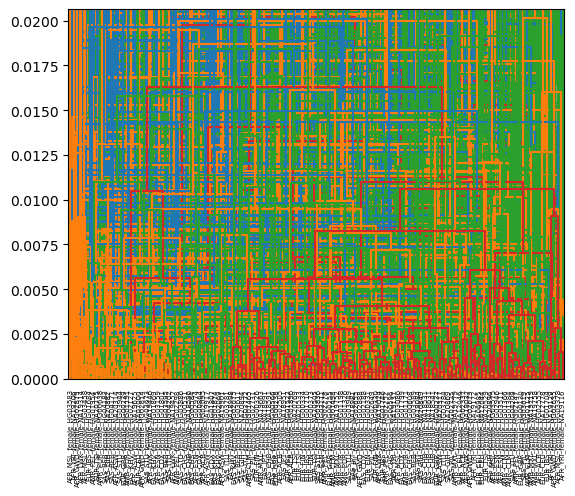

In [190]:
idx = sorted(set(comp_list.ind1).union(comp_list.ind2))
sub_idx = []
for i in idx:
    sub_idx.append(i[4:7])

tree_summary = {}
tree_complete = {}
#takes about 3 minutes 20 seconds +/-
for i in range(len(windows_tuples)):
    w = windows_tuples[i]
    window_stats, whole_tree = one_window_tree(dict_3d, w, tree_summary, tree_complete, link_method='complete', idx=idx)
    tree_summary[w] = window_stats
    tree_complete[w] = whole_tree

    if i%100==0:
        print(i)


# Define IDWs

In [191]:
dataframe = pd.DataFrame.from_dict(tree_summary, orient='index', columns=list(idx) + ['coord_0','coord_1','coord_2','coord_3'])

counts_df = dataframe.drop(columns=['coord_0','coord_1', 'coord_2','coord_3']).apply(lambda s: s.value_counts(), axis=1).fillna(0)     
counts_df['depth'] = dataframe['coord_1']

In [192]:
idw = counts_df[(counts_df.C0==1 )|(counts_df.C1==1)|(counts_df.C2==1)|(counts_df.C3==1)|(counts_df.C4==1)|(counts_df.C5==1)]

In [193]:
idw_list = []
for r in idw.index:
    row = dataframe.loc[[r]]
    ind = row.where(row=='C0').dropna(how='all').dropna(axis=1).dropna(axis=1).columns[0]
    idw_list.append(ind)
idw['individual'] = idw_list

len(idw_list)

/scratch/egilbertson/ipykernel_28542/424813067.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  idw['individual'] = idw_list


1251

In [194]:
idw

,C0,C1,C2,C3,C4,C5,depth,individual
"(chr1, 3670016)",1.0,47.0,82.0,0.0,0.0,0.0,0.016704,AFR_ASW_female_NA19901
"(chr1, 6291456)",1.0,16.0,113.0,0.0,0.0,0.0,0.003675,AFR_ASW_female_NA19625
"(chr1, 7340032)",1.0,129.0,0.0,0.0,0.0,0.0,0.002926,SAS_BEB_female_HG04183
"(chr1, 10485760)",1.0,129.0,0.0,0.0,0.0,0.0,0.019718,AFR_MSL_female_HG03575
"(chr1, 11010048)",1.0,129.0,0.0,0.0,0.0,0.0,0.050779,AFR_MSL_female_HG03575
...,...,...,...,...,...,...,...,...
"(chr22, 40894464)",1.0,129.0,0.0,0.0,0.0,0.0,0.009164,SAS_STU_female_HG03673
"(chr22, 43515904)",1.0,129.0,0.0,0.0,0.0,0.0,0.011355,AMR_PUR_female_HG01326
"(chr22, 44564480)",1.0,62.0,67.0,0.0,0.0,0.0,0.025806,AFR_GWD_female_HG02879
"(chr22, 45613056)",1.0,129.0,0.0,0.0,0.0,0.0,0.022792,AFR_ACB_female_HG02555


In [195]:
vcf_index = pd.read_csv('%s/vcfs/vcf_indexing.txt' % DATA_PATH, index_col=0)
vcf_index = vcf_index.reset_index()

In [196]:
idw

,C0,C1,C2,C3,C4,C5,depth,individual
"(chr1, 3670016)",1.0,47.0,82.0,0.0,0.0,0.0,0.016704,AFR_ASW_female_NA19901
"(chr1, 6291456)",1.0,16.0,113.0,0.0,0.0,0.0,0.003675,AFR_ASW_female_NA19625
"(chr1, 7340032)",1.0,129.0,0.0,0.0,0.0,0.0,0.002926,SAS_BEB_female_HG04183
"(chr1, 10485760)",1.0,129.0,0.0,0.0,0.0,0.0,0.019718,AFR_MSL_female_HG03575
"(chr1, 11010048)",1.0,129.0,0.0,0.0,0.0,0.0,0.050779,AFR_MSL_female_HG03575
...,...,...,...,...,...,...,...,...
"(chr22, 40894464)",1.0,129.0,0.0,0.0,0.0,0.0,0.009164,SAS_STU_female_HG03673
"(chr22, 43515904)",1.0,129.0,0.0,0.0,0.0,0.0,0.011355,AMR_PUR_female_HG01326
"(chr22, 44564480)",1.0,62.0,67.0,0.0,0.0,0.0,0.025806,AFR_GWD_female_HG02879
"(chr22, 45613056)",1.0,129.0,0.0,0.0,0.0,0.0,0.022792,AFR_ACB_female_HG02555


In [197]:
vcf_index

,level_0,name,super,sub,sex,id,index,0
0,90,EUR_GBR_female_HG00130,EUR,GBR,female,HG00130,36,HG00130
1,91,EUR_GBR_female_HG00237,EUR,GBR,female,HG00237,87,HG00237
2,92,EUR_GBR_female_HG00238,EUR,GBR,female,HG00238,88,HG00238
3,93,EUR_GBR_female_HG00239,EUR,GBR,female,HG00239,89,HG00239
4,94,EUR_GBR_female_HG00255,EUR,GBR,female,HG00255,102,HG00255
...,...,...,...,...,...,...,...,...
125,110,SAS_GIH_female_NA20849,SAS,GIH,female,NA20849,2449,NA20849
126,111,SAS_GIH_female_NA20869,SAS,GIH,female,NA20869,2465,NA20869
127,112,SAS_GIH_female_NA20882,SAS,GIH,female,NA20882,2475,NA20882
128,113,SAS_GIH_female_NA20894,SAS,GIH,female,NA20894,2486,NA20894


In [198]:
idw_params = idw[['individual','depth']].reset_index()
idw_params['chr'], idw_params['pos'] = idw_params['index'].str
idw_params['col_id'] = idw_params.apply(lambda x: get_col_id(x), axis=1)

idw_params['end'] = idw_params['pos']+2**20
idw_params = idw_params[['col_id','chr','pos','end','individual', 'depth']]

/scratch/egilbertson/ipykernel_28542/1310738606.py:2: FutureWarning: Columnar iteration over characters will be deprecated in future releases.
  idw_params['chr'], idw_params['pos'] = idw_params['index'].str


AFR_ASW_female_NA19901
AFR_ASW_female_NA19901
121
AFR_ASW_female_NA19625
AFR_ASW_female_NA19625
115
SAS_BEB_female_HG04183
SAS_BEB_female_HG04183
87
AFR_MSL_female_HG03575
AFR_MSL_female_HG03575
72
AFR_MSL_female_HG03575
AFR_MSL_female_HG03575
72
EAS_JPT_female_NA18951
EAS_JPT_female_NA18951
100
AMR_MXL_female_NA19752
AMR_MXL_female_NA19752
118
AFR_LWK_female_NA19446
AFR_LWK_female_NA19446
113
AFR_LWK_female_NA19446
AFR_LWK_female_NA19446
113
EAS_CHS_female_HG00566
EAS_CHS_female_HG00566
16
AFR_ESN_female_HG03159
AFR_ESN_female_HG03159
68
AFR_ESN_female_HG03159
AFR_ESN_female_HG03159
68
AFR_YRI_female_NA19116
AFR_YRI_female_NA19116
107
EAS_JPT_female_NA18991
EAS_JPT_female_NA18991
102
AFR_ACB_female_HG02505
AFR_ACB_female_HG02505
53
AFR_ACB_female_HG02505
AFR_ACB_female_HG02505
53
EUR_CEU_female_NA07000
EUR_CEU_female_NA07000
91
EUR_IBS_female_HG01746
EUR_IBS_female_HG01746
35
AFR_ESN_female_HG03159
AFR_ESN_female_HG03159
68
AFR_GWD_female_HG02679
AFR_GWD_female_HG02679
58
AFR_ASW_fema

In [103]:
idw_params.to_csv('%s/IDWs/idw_mut_params.txt' % DATA_PATH, header=False, index=False, sep='\t')

In [199]:
idw_params

,col_id,chr,pos,end,individual,depth
0,121,chr1,3670016,4718592,AFR_ASW_female_NA19901,0.016704
1,115,chr1,6291456,7340032,AFR_ASW_female_NA19625,0.003675
2,87,chr1,7340032,8388608,SAS_BEB_female_HG04183,0.002926
3,72,chr1,10485760,11534336,AFR_MSL_female_HG03575,0.019718
4,72,chr1,11010048,12058624,AFR_MSL_female_HG03575,0.050779
...,...,...,...,...,...,...
1246,78,chr22,40894464,41943040,SAS_STU_female_HG03673,0.009164
1247,26,chr22,43515904,44564480,AMR_PUR_female_HG01326,0.011355
1248,62,chr22,44564480,45613056,AFR_GWD_female_HG02879,0.025806
1249,54,chr22,45613056,46661632,AFR_ACB_female_HG02555,0.022792


# IDW properties

In [200]:
idw_counts = dict.fromkeys(['AFR','AMR','EUR','EAS','SAS'])
for key in idw_counts.keys():
    idw_counts[key] = 0

for i in range(idw.shape[0]):
    super_pop = get_super_pop(idw.iloc[i])
    idw_counts[super_pop] += 1

In [201]:
idw.sort_values(by='depth')

,C0,C1,C2,C3,C4,C5,depth,individual
"(chr2, 160432128)",1.0,17.0,112.0,0.0,0.0,0.0,0.000665,EUR_CEU_female_NA06985
"(chr12, 87556096)",1.0,129.0,0.0,0.0,0.0,0.0,0.000691,AFR_YRI_female_NA19172
"(chr11, 16252928)",1.0,60.0,69.0,0.0,0.0,0.0,0.000938,AFR_ESN_female_HG02974
"(chr5, 88080384)",1.0,129.0,0.0,0.0,0.0,0.0,0.000965,SAS_ITU_female_HG03772
"(chr7, 35651584)",1.0,129.0,0.0,0.0,0.0,0.0,0.000970,AFR_MSL_female_HG03583
...,...,...,...,...,...,...,...,...
"(chr21, 16252928)",1.0,129.0,0.0,0.0,0.0,0.0,0.360948,EUR_IBS_female_HG01522
"(chr6, 60293120)",1.0,129.0,0.0,0.0,0.0,0.0,0.413927,EAS_CHS_female_HG00596
"(chr8, 114294784)",1.0,129.0,0.0,0.0,0.0,0.0,0.429153,EAS_KHV_female_HG02127
"(chr14, 46137344)",1.0,129.0,0.0,0.0,0.0,0.0,0.444698,AFR_ESN_female_HG02946


In [202]:
idw_params

,col_id,chr,pos,end,individual,depth
0,121,chr1,3670016,4718592,AFR_ASW_female_NA19901,0.016704
1,115,chr1,6291456,7340032,AFR_ASW_female_NA19625,0.003675
2,87,chr1,7340032,8388608,SAS_BEB_female_HG04183,0.002926
3,72,chr1,10485760,11534336,AFR_MSL_female_HG03575,0.019718
4,72,chr1,11010048,12058624,AFR_MSL_female_HG03575,0.050779
...,...,...,...,...,...,...
1246,78,chr22,40894464,41943040,SAS_STU_female_HG03673,0.009164
1247,26,chr22,43515904,44564480,AMR_PUR_female_HG01326,0.011355
1248,62,chr22,44564480,45613056,AFR_GWD_female_HG02879,0.025806
1249,54,chr22,45613056,46661632,AFR_ACB_female_HG02555,0.022792


# Private variants

In [203]:
idw

,C0,C1,C2,C3,C4,C5,depth,individual
"(chr1, 3670016)",1.0,47.0,82.0,0.0,0.0,0.0,0.016704,AFR_ASW_female_NA19901
"(chr1, 6291456)",1.0,16.0,113.0,0.0,0.0,0.0,0.003675,AFR_ASW_female_NA19625
"(chr1, 7340032)",1.0,129.0,0.0,0.0,0.0,0.0,0.002926,SAS_BEB_female_HG04183
"(chr1, 10485760)",1.0,129.0,0.0,0.0,0.0,0.0,0.019718,AFR_MSL_female_HG03575
"(chr1, 11010048)",1.0,129.0,0.0,0.0,0.0,0.0,0.050779,AFR_MSL_female_HG03575
...,...,...,...,...,...,...,...,...
"(chr22, 40894464)",1.0,129.0,0.0,0.0,0.0,0.0,0.009164,SAS_STU_female_HG03673
"(chr22, 43515904)",1.0,129.0,0.0,0.0,0.0,0.0,0.011355,AMR_PUR_female_HG01326
"(chr22, 44564480)",1.0,62.0,67.0,0.0,0.0,0.0,0.025806,AFR_GWD_female_HG02879
"(chr22, 45613056)",1.0,129.0,0.0,0.0,0.0,0.0,0.022792,AFR_ACB_female_HG02555


In [204]:
idw[['chr','window']] = pd.DataFrame(idw.index.tolist(), index=idw.index)

/scratch/egilbertson/ipykernel_28542/3695553503.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  idw[['chr','window']] = pd.DataFrame(idw.index.tolist(), index=idw.index)
/scratch/egilbertson/ipykernel_28542/3695553503.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  idw[['chr','window']] = pd.DataFrame(idw.index.tolist(), index=idw.index)


In [205]:
idw

,C0,C1,C2,C3,C4,C5,depth,individual,chr,window
"(chr1, 3670016)",1.0,47.0,82.0,0.0,0.0,0.0,0.016704,AFR_ASW_female_NA19901,chr1,3670016
"(chr1, 6291456)",1.0,16.0,113.0,0.0,0.0,0.0,0.003675,AFR_ASW_female_NA19625,chr1,6291456
"(chr1, 7340032)",1.0,129.0,0.0,0.0,0.0,0.0,0.002926,SAS_BEB_female_HG04183,chr1,7340032
"(chr1, 10485760)",1.0,129.0,0.0,0.0,0.0,0.0,0.019718,AFR_MSL_female_HG03575,chr1,10485760
"(chr1, 11010048)",1.0,129.0,0.0,0.0,0.0,0.0,0.050779,AFR_MSL_female_HG03575,chr1,11010048
...,...,...,...,...,...,...,...,...,...,...
"(chr22, 40894464)",1.0,129.0,0.0,0.0,0.0,0.0,0.009164,SAS_STU_female_HG03673,chr22,40894464
"(chr22, 43515904)",1.0,129.0,0.0,0.0,0.0,0.0,0.011355,AMR_PUR_female_HG01326,chr22,43515904
"(chr22, 44564480)",1.0,62.0,67.0,0.0,0.0,0.0,0.025806,AFR_GWD_female_HG02879,chr22,44564480
"(chr22, 45613056)",1.0,129.0,0.0,0.0,0.0,0.0,0.022792,AFR_ACB_female_HG02555,chr22,45613056


In [215]:
def get_num_vars(row):
    chr = row.chr
    w = row.window

    nv = ism[ism.chr==chr][ism.window == w].mse.dropna().shape[0]

    return nv

In [216]:
idw['num_vars'] = idw.apply(lambda x: get_num_vars(x), axis =1)

/scratch/egilbertson/ipykernel_28542/2067406734.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  nv = ism[ism.chr==chr][ism.window == w].mse.dropna().shape[0]
/scratch/egilbertson/ipykernel_28542/789181734.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  idw['num_vars'] = idw.apply(lambda x: get_num_vars(x), axis =1)


In [217]:
idw[['super_pop','sub_pop','sex','id']] = idw.individual.str.split('_', expand=True)

/scratch/egilbertson/ipykernel_28542/1311924430.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  idw[['super_pop','sub_pop','sex','id']] = idw.individual.str.split('_', expand=True)


In [218]:
idw

,C0,C1,C2,C3,C4,C5,depth,individual,chr,window,num_vars,super_pop,sub_pop,sex,id
"(chr1, 3670016)",1.0,47.0,82.0,0.0,0.0,0.0,0.016704,AFR_ASW_female_NA19901,chr1,3670016,30,AFR,ASW,female,NA19901
"(chr1, 6291456)",1.0,16.0,113.0,0.0,0.0,0.0,0.003675,AFR_ASW_female_NA19625,chr1,6291456,33,AFR,ASW,female,NA19625
"(chr1, 7340032)",1.0,129.0,0.0,0.0,0.0,0.0,0.002926,SAS_BEB_female_HG04183,chr1,7340032,18,SAS,BEB,female,HG04183
"(chr1, 10485760)",1.0,129.0,0.0,0.0,0.0,0.0,0.019718,AFR_MSL_female_HG03575,chr1,10485760,56,AFR,MSL,female,HG03575
"(chr1, 11010048)",1.0,129.0,0.0,0.0,0.0,0.0,0.050779,AFR_MSL_female_HG03575,chr1,11010048,68,AFR,MSL,female,HG03575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"(chr22, 40894464)",1.0,129.0,0.0,0.0,0.0,0.0,0.009164,SAS_STU_female_HG03673,chr22,40894464,28,SAS,STU,female,HG03673
"(chr22, 43515904)",1.0,129.0,0.0,0.0,0.0,0.0,0.011355,AMR_PUR_female_HG01326,chr22,43515904,17,AMR,PUR,female,HG01326
"(chr22, 44564480)",1.0,62.0,67.0,0.0,0.0,0.0,0.025806,AFR_GWD_female_HG02879,chr22,44564480,80,AFR,GWD,female,HG02879
"(chr22, 45613056)",1.0,129.0,0.0,0.0,0.0,0.0,0.022792,AFR_ACB_female_HG02555,chr22,45613056,21,AFR,ACB,female,HG02555


In [219]:
amr_pal = sns.diverging_palette(50,230, s=82, l=58, n=10)[-4:]
eur_pal = sns.diverging_palette(50,230, s=82, l=58, n=15)[:5]
afr_pal = sns.diverging_palette(50,369, s=82, l=58, n=17)[-7:]
sas_pal = sns.diverging_palette(190,369, s=82, l=58, n=12)[:5]
eas_pal = sns.diverging_palette(110,105, s=75, l=65, n=10)[:5]

my_pal = eur_pal + amr_pal + eas_pal + sas_pal + afr_pal

#sub_order = my_order
sub_pal = my_pal

sup_pal = [eur_pal[0], amr_pal[3], eas_pal[0], sas_pal[0], afr_pal[6]]

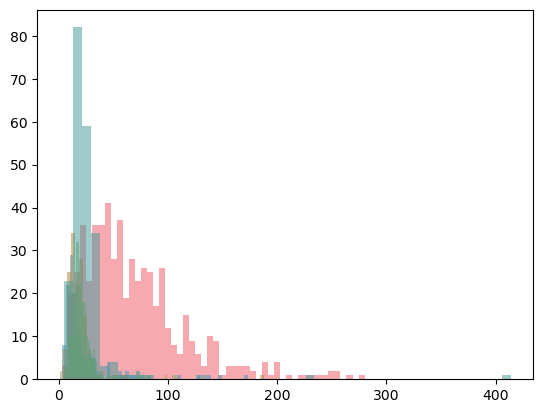

In [221]:
plt.hist(idw[idw.super_pop=='AFR'].num_vars, bins=50, color=afr_pal[6], alpha=.5)
plt.hist(idw[idw.super_pop=='AMR'].num_vars, bins=50, color=amr_pal[3], alpha=.5)
plt.hist(idw[idw.super_pop=='EUR'].num_vars, bins=50, color=eur_pal[0], alpha=.5)
plt.hist(idw[idw.super_pop=='EAS'].num_vars, bins=50, color=eas_pal[0], alpha=.5)
plt.hist(idw[idw.super_pop=='SAS'].num_vars, bins=50, color = sas_pal[0], alpha=.5)
plt.show()

# in silico mutagenesis

## setup

In [213]:
ism = pd.read_table('%s/in_silico_mutagenesis/IDW/ism_scores_idw_rare_alternate.txt' % DATA_PATH)
ism = ism.loc[ism['ref'].str.len() == 1].loc[ism['alt'].str.len() == 1]
# ancestral 3D dataframes
anc_spear = pd.read_table('%s/comp_tables/anc_window_spearman.csv' % RESULTS_PATH
                    , sep=',', header=[0,1,2,3], index_col=[0,1])
anc_div = 1-anc_spear

ref_spear = pd.read_table('%s/comp_tables/ref_window_spearman.csv' % RESULTS_PATH
                    , sep=',', header=[0,1,2,3], index_col=[0,1])
ref_div = 1-ref_spear

ref_fasta_open = pysam.Fastafile('/wynton/group/capra/projects/modern_human_3Dgenome/data/genomes/hg38_reference.fa')


In [214]:
ism.loc[ism['ref'].str.len() == 1].loc[ism['alt'].str.len() == 1]

,chr,pos,window,ref,alt,mse,1-pearson,1-spearman
1,chr1,3760758,3670016,T,G,9.714308e-08,1.496074e-07,2.177228e-07
2,chr1,3880554,3670016,C,T,3.777337e-07,7.379900e-07,1.525400e-06
3,chr1,3959104,3670016,C,T,3.469086e-08,6.555761e-08,1.744102e-07
4,chr1,3965875,3670016,C,T,7.504695e-07,7.966452e-07,2.335052e-06
5,chr1,3967782,3670016,T,C,2.690805e-08,1.820807e-08,5.624173e-08
...,...,...,...,...,...,...,...,...
59791,chr9,135105641,134217728,C,T,3.070655e-07,1.917313e-06,2.248473e-06
59792,chr9,135125457,134217728,C,T,3.378513e-09,1.925459e-08,2.505910e-08
59793,chr9,135147766,134217728,A,G,1.335177e-08,7.497941e-08,8.755752e-08
59794,chr9,135183935,134217728,T,C,1.889295e-08,9.877974e-08,9.744374e-08


In [222]:
vcf_index

,level_0,name,super,sub,sex,id,index,0
0,90,EUR_GBR_female_HG00130,EUR,GBR,female,HG00130,36,HG00130
1,91,EUR_GBR_female_HG00237,EUR,GBR,female,HG00237,87,HG00237
2,92,EUR_GBR_female_HG00238,EUR,GBR,female,HG00238,88,HG00238
3,93,EUR_GBR_female_HG00239,EUR,GBR,female,HG00239,89,HG00239
4,94,EUR_GBR_female_HG00255,EUR,GBR,female,HG00255,102,HG00255
...,...,...,...,...,...,...,...,...
125,110,SAS_GIH_female_NA20849,SAS,GIH,female,NA20849,2449,NA20849
126,111,SAS_GIH_female_NA20869,SAS,GIH,female,NA20869,2465,NA20869
127,112,SAS_GIH_female_NA20882,SAS,GIH,female,NA20882,2475,NA20882
128,113,SAS_GIH_female_NA20894,SAS,GIH,female,NA20894,2486,NA20894


In [223]:
idw.sort_values(by='depth')

,C0,C1,C2,C3,C4,C5,depth,individual,chr,window,num_vars,super_pop,sub_pop,sex,id
"(chr2, 160432128)",1.0,17.0,112.0,0.0,0.0,0.0,0.000665,EUR_CEU_female_NA06985,chr2,160432128,19,EUR,CEU,female,NA06985
"(chr12, 87556096)",1.0,129.0,0.0,0.0,0.0,0.0,0.000691,AFR_YRI_female_NA19172,chr12,87556096,200,AFR,YRI,female,NA19172
"(chr11, 16252928)",1.0,60.0,69.0,0.0,0.0,0.0,0.000938,AFR_ESN_female_HG02974,chr11,16252928,43,AFR,ESN,female,HG02974
"(chr5, 88080384)",1.0,129.0,0.0,0.0,0.0,0.0,0.000965,SAS_ITU_female_HG03772,chr5,88080384,19,SAS,ITU,female,HG03772
"(chr7, 35651584)",1.0,129.0,0.0,0.0,0.0,0.0,0.000970,AFR_MSL_female_HG03583,chr7,35651584,71,AFR,MSL,female,HG03583
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"(chr21, 16252928)",1.0,129.0,0.0,0.0,0.0,0.0,0.360948,EUR_IBS_female_HG01522,chr21,16252928,16,EUR,IBS,female,HG01522
"(chr6, 60293120)",1.0,129.0,0.0,0.0,0.0,0.0,0.413927,EAS_CHS_female_HG00596,chr6,60293120,11,EAS,CHS,female,HG00596
"(chr8, 114294784)",1.0,129.0,0.0,0.0,0.0,0.0,0.429153,EAS_KHV_female_HG02127,chr8,114294784,16,EAS,KHV,female,HG02127
"(chr14, 46137344)",1.0,129.0,0.0,0.0,0.0,0.0,0.444698,AFR_ESN_female_HG02946,chr14,46137344,61,AFR,ESN,female,HG02946


### test example

## 5 deepest trees

/scratch/egilbertson/ipykernel_28542/645439438.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for i in ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False).index:


chr3
174587904
1/1 [==============================] - 1s 1s/step
175318568 0.557366277308339


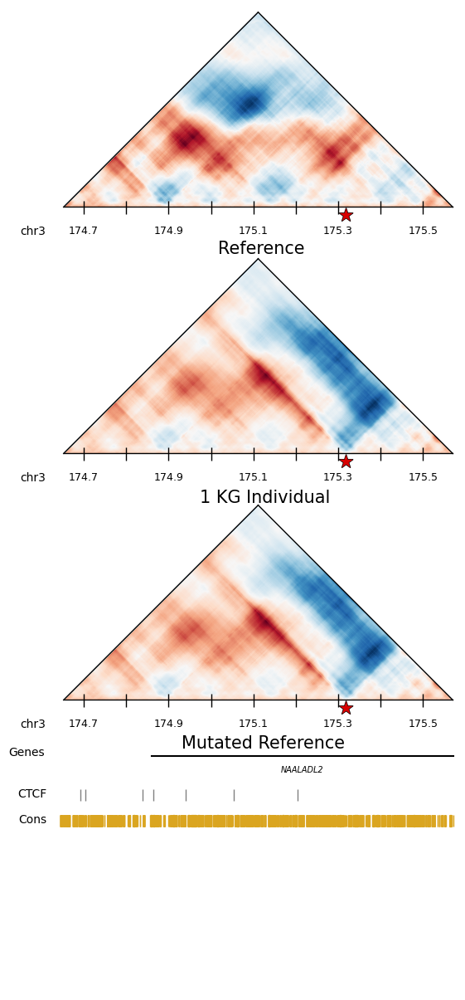

/scratch/egilbertson/ipykernel_28542/645439438.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]


G
1048576
T
1048576
C
1048576
G
1048576
A
1048576
A
1048576
G
1048576
T
1048576
A
1048576
C
1048576
T
1048576
T
1048576
T
1048576
T
1048576
T
1048576
G
1048576
C
1048576
C
1048576
A
1048576
G
1048576
A
1048576
T
1048576
1/1 [==============================] - 2s 2s/step


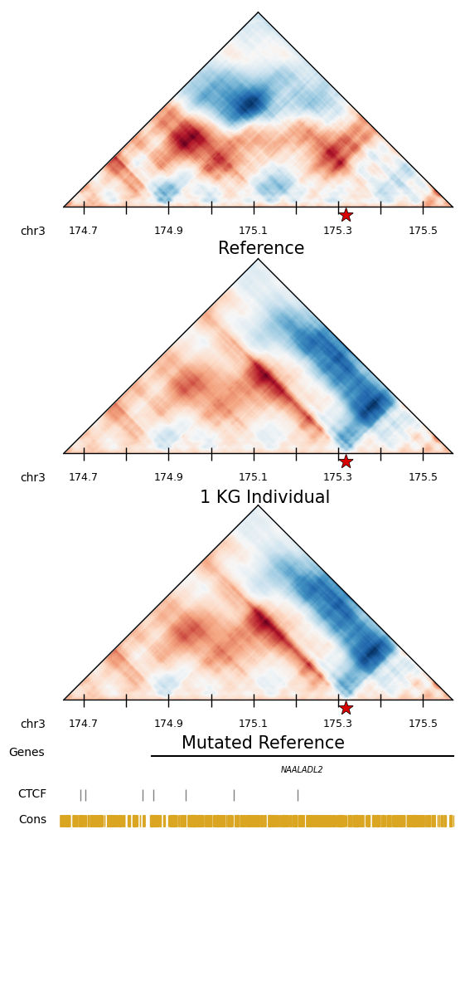

divergence ref:mut = 0.5563465850927232
divergence ref:ind = 0.7100576772177458
num variants: 22


/scratch/egilbertson/ipykernel_28542/645439438.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))


In [234]:
chrm = 'chr3'
wndw = 174587904
individual = 'SAS_BEB_female_HG04183'

ind_pred = load_1kg_map(chrm, wndw, individual)
for i in ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False).index:
    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))


/scratch/egilbertson/ipykernel_28542/542654892.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ism_df = ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False)


chr14
46137344
1/1 [==============================] - 1s 1s/step
46581275 0.36535478677978706


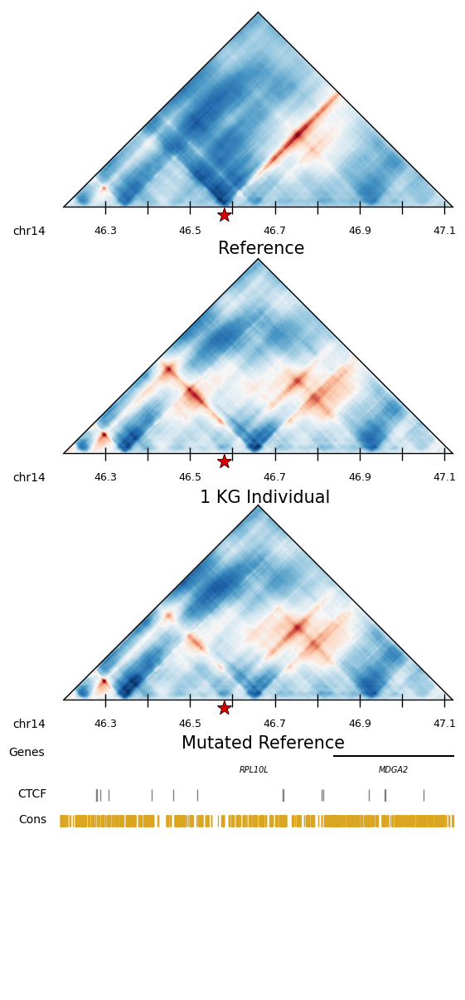

A
1048576
1/1 [==============================] - 1s 1s/step


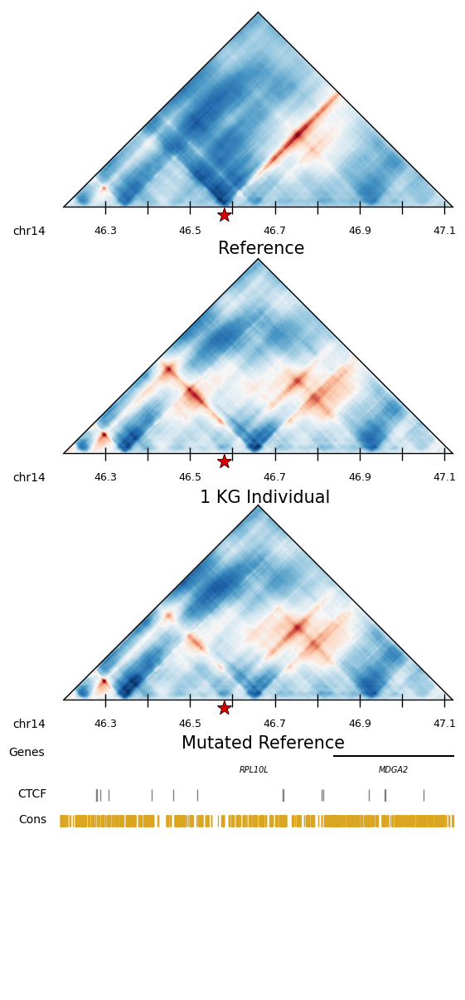

divergence ref:mut = 0.36535478677978706
divergence ref:ind = 0.591705713869465
num variants: 1


,chr,pos,window,ref,alt,mse,1-pearson,1-spearman
14422,chr14,46581275,46137344,G,A,0.006225,0.310098,0.365355


In [228]:
chrm = 'chr14'
wndw = 46137344
individual = 'AFR_ESN_female_HG02946'
ind_pred = load_1kg_map(chrm, wndw, individual)
ism_df = ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False)
for i in ism_df.index:
    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    ref_allele = ism.loc[i]['ref']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = ism_df[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism_df.shape[0]))
ism_df

/scratch/egilbertson/ipykernel_28542/4232159766.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ism_df = ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False)


chr8
114294784
1/1 [==============================] - 1s 1s/step
115076908 0.3428930861315057


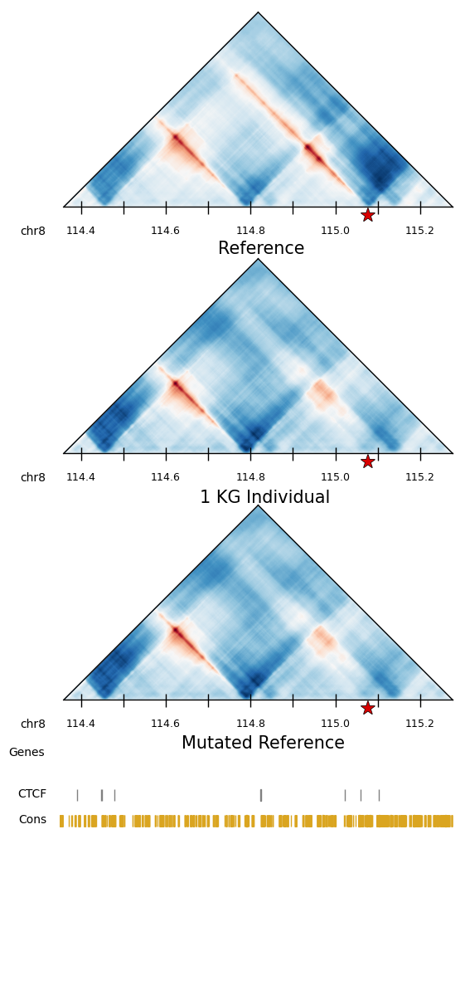

G
1048576
1/1 [==============================] - 1s 1s/step


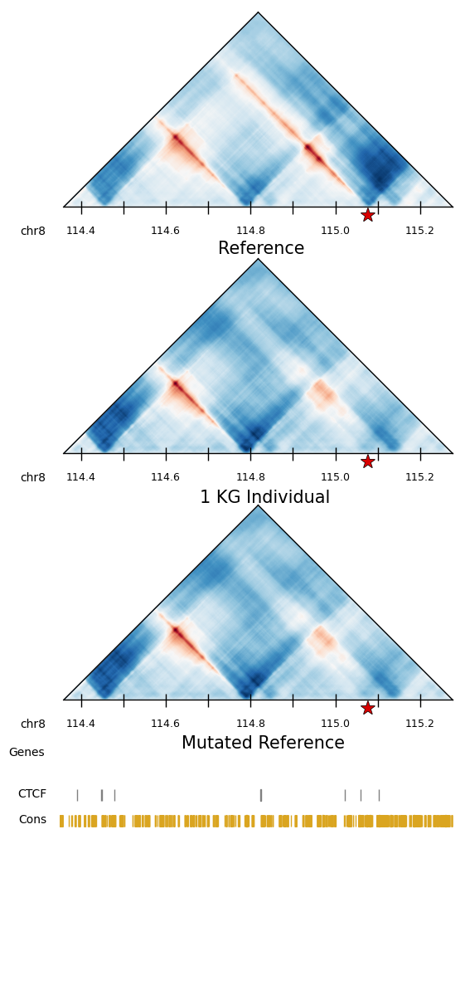

divergence ref:mut = 0.3428930861315057
divergence ref:ind = 0.4944560944291736
num variants: 1


,chr,pos,window,ref,alt,mse,1-pearson,1-spearman
57020,chr8,115076908,114294784,T,G,0.01022,0.321467,0.342894


In [230]:
chrm = 'chr8'
wndw = 114294784
individual = 'EAS_KHV_female_HG02127'
ind_pred = load_1kg_map(chrm, wndw, individual)
ism_df = ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False)
for i in ism_df.index:

    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    ref_allele = ism.loc[i]['ref']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = ism_df[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism_df.shape[0]))
ism_df

/scratch/egilbertson/ipykernel_28542/430085006.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ism_df = ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False)


chr6
60293120
1/1 [==============================] - 1s 1s/step
60572812 0.3917110902759209


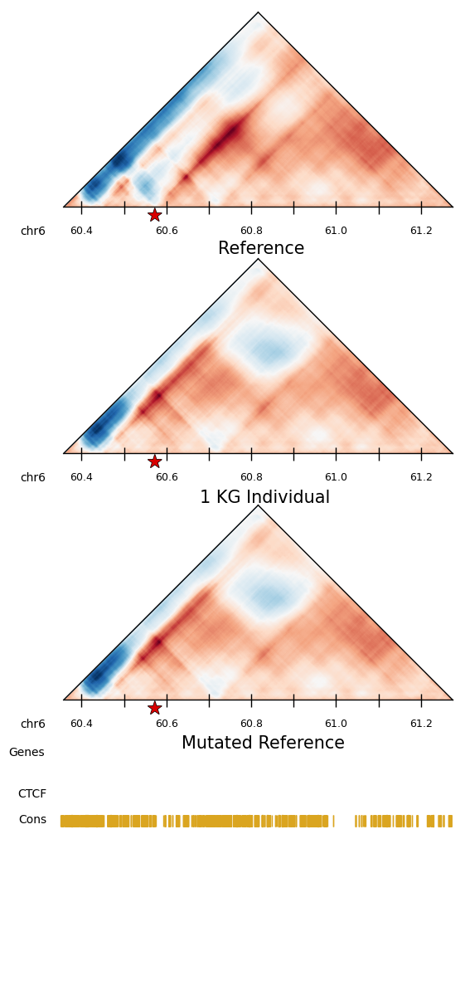

C
1048576
1/1 [==============================] - 1s 1s/step


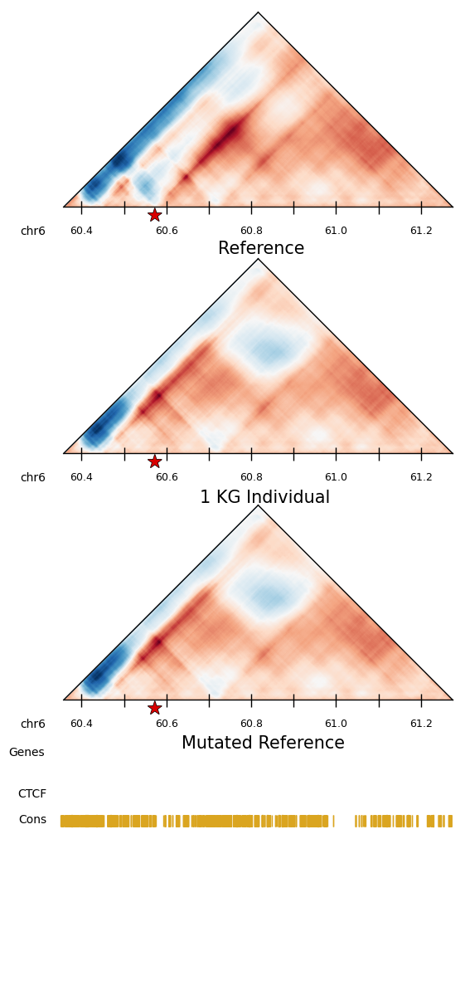

divergence ref:mut = 0.3917110902759209
divergence ref:ind = 0.44174020709014306
num variants: 1


,chr,pos,window,ref,alt,mse,1-pearson,1-spearman
47298,chr6,60572812,60293120,G,C,0.011404,0.314761,0.391712


In [231]:
chrm = 'chr6'
wndw = 60293120
individual = 'EAS_CHS_female_HG00596'
ind_pred = load_1kg_map(chrm, wndw, individual)
ism_df = ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False)
for i in ism_df.index:
    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    ref_allele = ism.loc[i]['ref']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = ism_df[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism_df.shape[0]))
ism_df

/scratch/egilbertson/ipykernel_28542/3487646553.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ism_df = ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False)


chr21
16252928
1/1 [==============================] - 1s 1s/step
16942887 0.21566756057242453


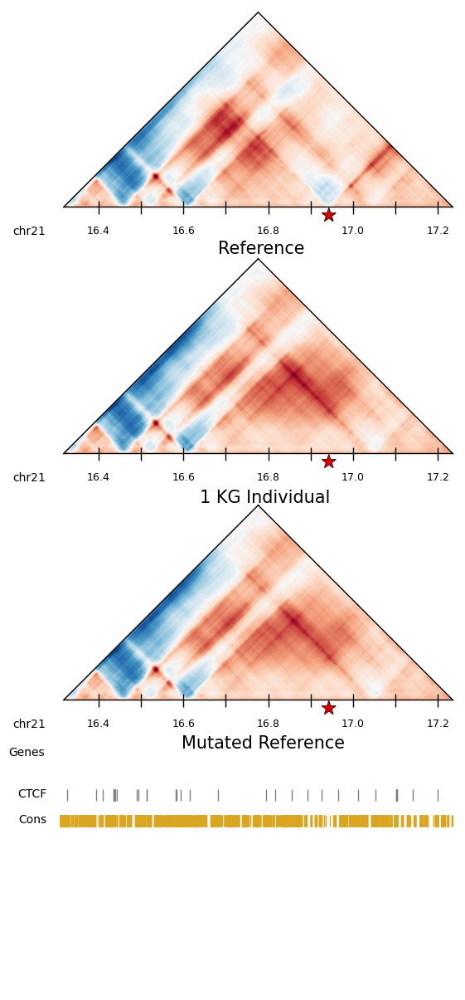

T
1048576
1/1 [==============================] - 1s 1s/step


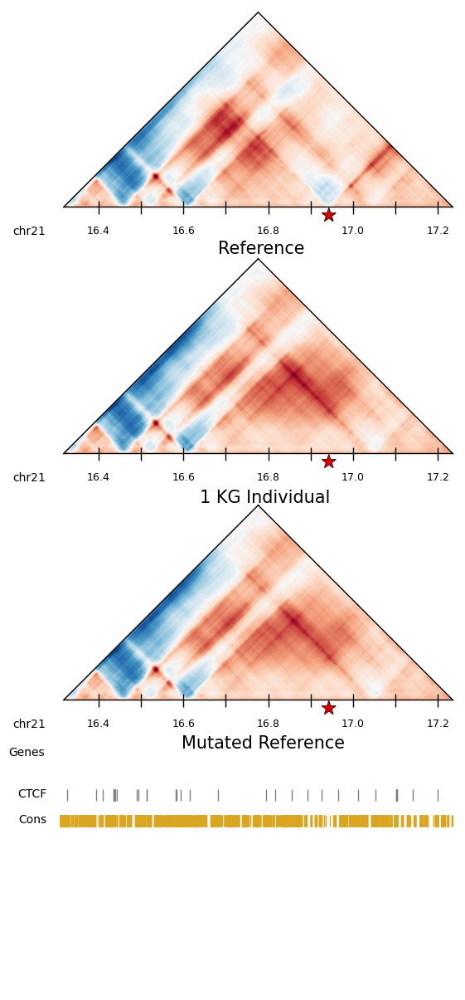

divergence ref:mut = 0.21566756057242453
divergence ref:ind = 0.601703010548251
num variants: 1


,chr,pos,window,ref,alt,mse,1-pearson,1-spearman
30293,chr21,16942887,16252928,A,T,0.004267,0.124686,0.215668


In [233]:
chrm = 'chr21'
wndw = 16252928
individual = 'EUR_IBS_female_HG01522'
ind_pred = load_1kg_map(chrm, wndw, individual)
ism_df = ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False)
for i in ism_df.index:
    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    ref_allele = ism.loc[i]['ref']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = ism_df[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism_df.shape[0]))
ism_df

In [ ]:
ism

,chr,pos,window,ref,alt,mse,1-pearson,1-spearman
0,chr1,41419194,41418752,G,A,4.010169e-10,1.528952e-09,2.227691e-09
1,chr1,41419903,41418752,T,A,6.424570e-10,2.430540e-09,4.395940e-09
2,chr1,41419982,41418752,G,A,2.975184e-10,9.618393e-10,2.712017e-09
3,chr1,41420026,41418752,T,C,1.394818e-10,4.707098e-10,1.339220e-09
4,chr1,41421729,41418752,G,A,1.894821e-10,7.112624e-10,1.574174e-09
...,...,...,...,...,...,...,...,...
721717,chr9,125819519,124780544,C,G,6.015042e-09,1.393339e-08,1.644450e-08
721718,chr9,125821620,124780544,G,A,2.798776e-09,6.660611e-09,1.031697e-08
721719,chr9,125824208,124780544,A,T,2.335459e-10,5.788691e-10,1.391949e-09
721720,chr9,125824786,124780544,C,T,2.315557e-09,5.479565e-09,6.564956e-09


## most explained windows

In [271]:
idw.sort_values(by='num_vars', ascending=False).head(29).individual.unique()

array(['SAS_GIH_female_NA20894', 'SAS_GIH_female_NA20869',
       'SAS_GIH_female_NA20896', 'SAS_GIH_female_NA20882'], dtype=object)

In [257]:
ism.groupby(['chr','window']).sum().sort_values(by='1-spearman', ascending=False).head(20)

/scratch/egilbertson/ipykernel_33288/1797789823.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ism.groupby(['chr','window']).sum().sort_values(by='1-spearman', ascending=False).head(20)


pos       mse  1-pearson  1-spearman
chr   window                                                   
chr4  34603008    791916657781  0.019985   0.802692    0.894257
      35127296    806294393029  0.018861   0.199364    0.337649
chr10 85458944   1791077012416  0.008835   0.048636    0.235841
chr6  116391936  2167444863139  0.039974   0.200728    0.206587
chr9  7864320     230756661283  0.006772   0.160357    0.201797
chr15 86507520   2109883621764  0.003123   0.132681    0.201082
chr10 31981568    655620406268  0.020839   0.137079    0.156780
chr2  206045184     1859609627  0.025052   0.139517    0.135467
chr6  144703488  2873404603023  0.007335   0.069345    0.110929
chr13 48234496    936432225044  0.010691   0.089689    0.107908
chr11 76546048   1568438295756  0.023859   0.097858    0.103752
chr6  144179200  2868749021185  0.008599   0.053753    0.097559
      88604672   1759186259578  0.029162   0.051506    0.093769
chr18 53477376   1127803468908  0.016583   0.067721    0.083924
chr17 37748736    468477080209  0.011554   0.065096    0.083092
chr1  190840832  3787449435673  0.001460   0.068528    0.079253
chr17 27787264    556309561809  0.030133   0.076195    0.077787
chr10 31457280    656391416064  0.020213   0.054437    0.072572
chr8  128974848  2654329016705  0.016801   0.032727    0.070442
chr6  88080384   1798401717619  0.010135   0.019750    0.061891

In [ ]:
idw[idw.chr=='chr4'][idw.window==35127296]

In [244]:
chrm = 'chr4'
wndw = 34603008
individual = 'SAS_GIH_female_NA20869'

ind_pred = load_1kg_map(chrm, wndw, individual)
for i in ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).index[0:5]:
    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos, arrow_star = True)

a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos, arrow_star = False)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))
ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)

/scratch/egilbertson/ipykernel_33288/1440294437.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for i in ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).index[0:5]:


chr4
34603008


KeyboardInterrupt: 

## Insert reference into IDW sequence

In [66]:
174587904 + 2**20

175636480

1/1 [==============================] - 1s 1s/step


/scratch/egilbertson/ipykernel_28542/1206892173.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for i in ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).index:


1/1 [==============================] - 2s 2s/step
175488957 0.0


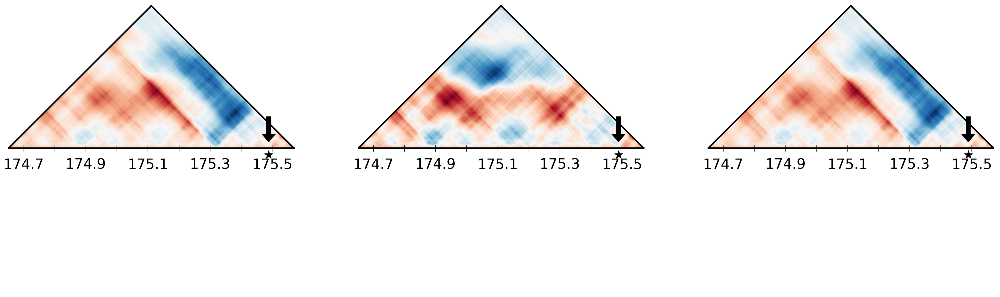

1/1 [==============================] - 2s 2s/step
174890509 0.0


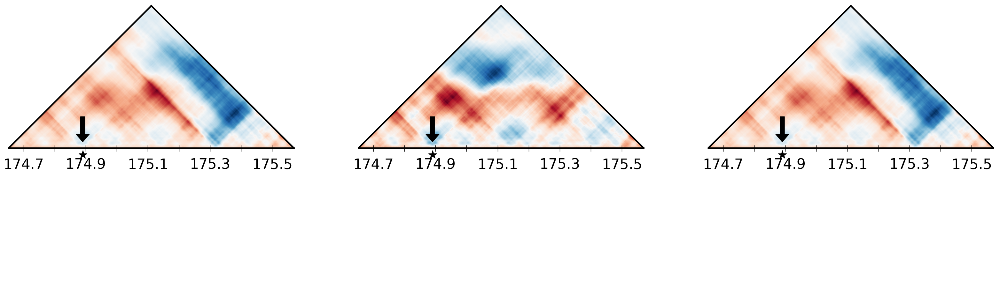

1/1 [==============================] - 1s 1s/step
175173064 0.0


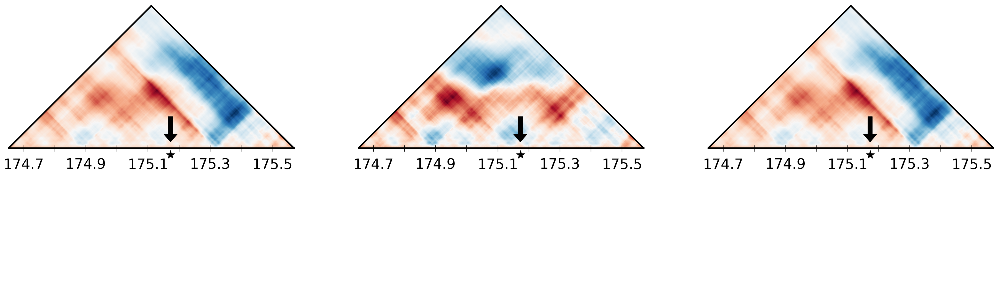

1/1 [==============================] - 1s 1s/step
175374359 0.0


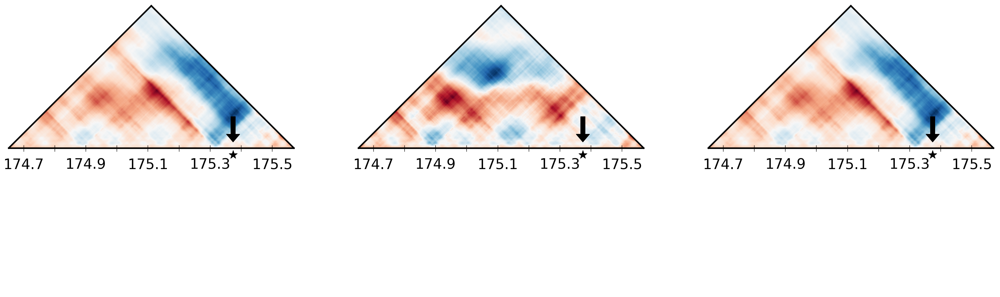

1/1 [==============================] - 1s 1s/step
175545091 0.0


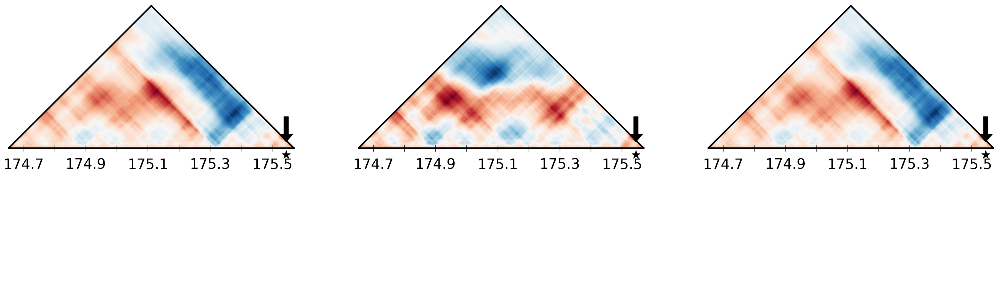

1/1 [==============================] - 1s 1s/step
175205059 0.0


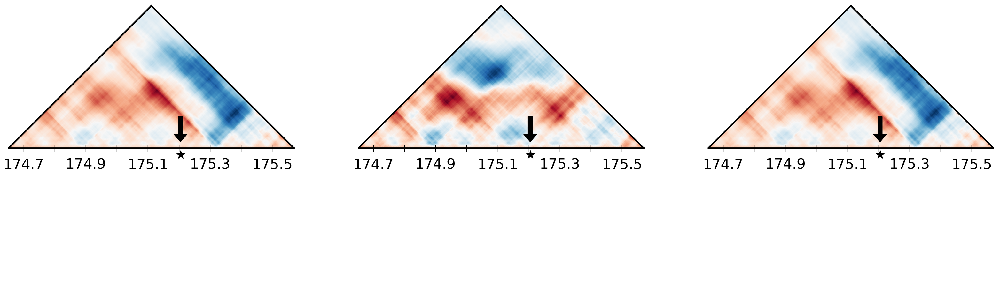

1/1 [==============================] - 2s 2s/step
175348236 0.0


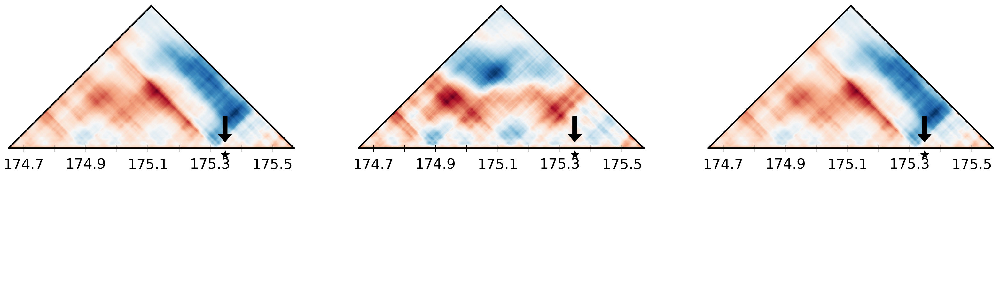

1/1 [==============================] - 1s 1s/step
174690960 0.0


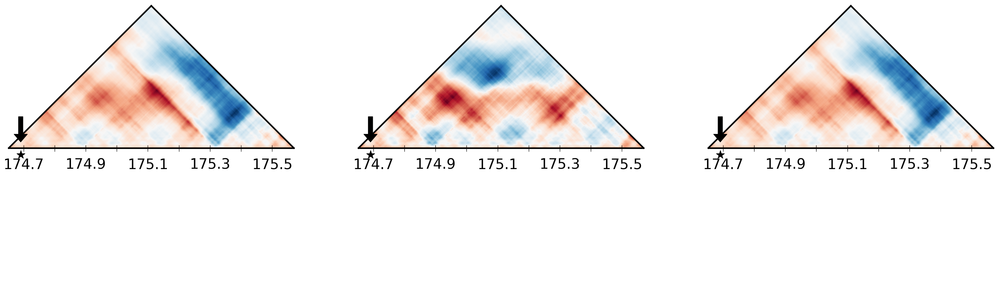

1/1 [==============================] - 1s 1s/step
175201845 0.0


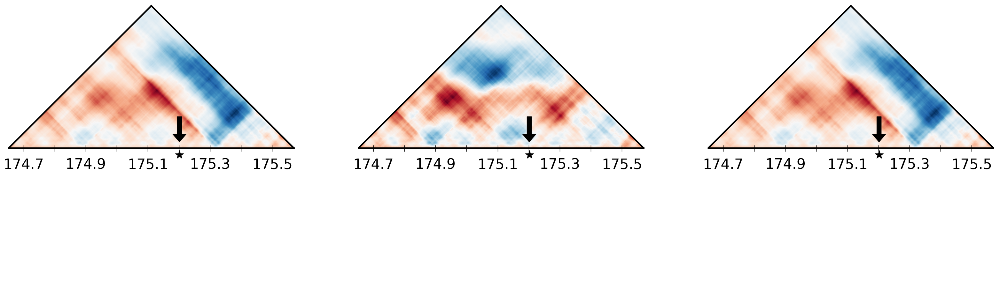

1/1 [==============================] - 2s 2s/step
174615321 0.0


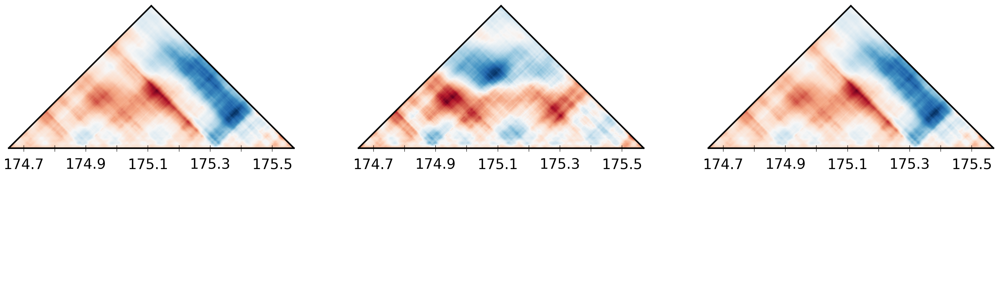

1/1 [==============================] - 1s 1s/step
175418089 0.0


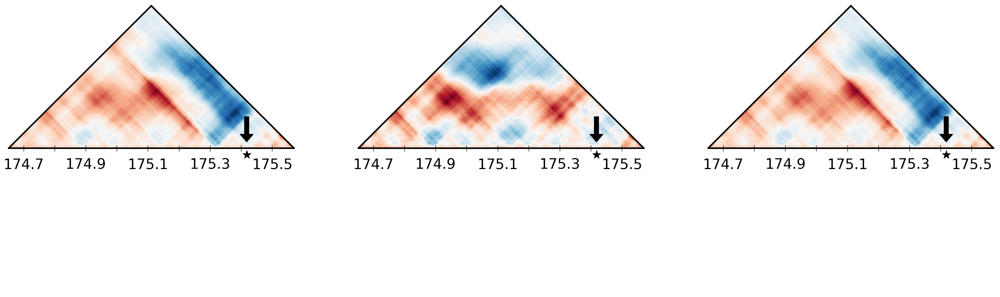

1/1 [==============================] - 1s 1s/step
174995134 0.0


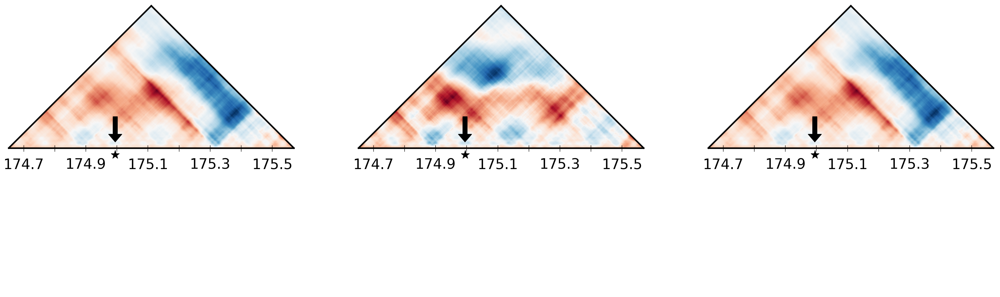

1/1 [==============================] - 1s 1s/step
175277615 0.0


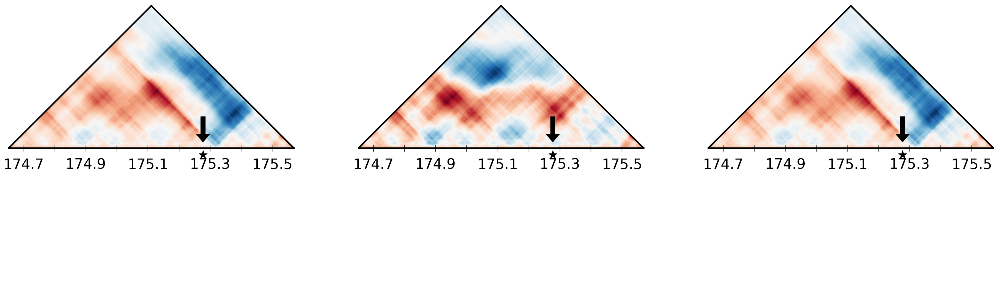

1/1 [==============================] - 1s 1s/step
174706996 0.0


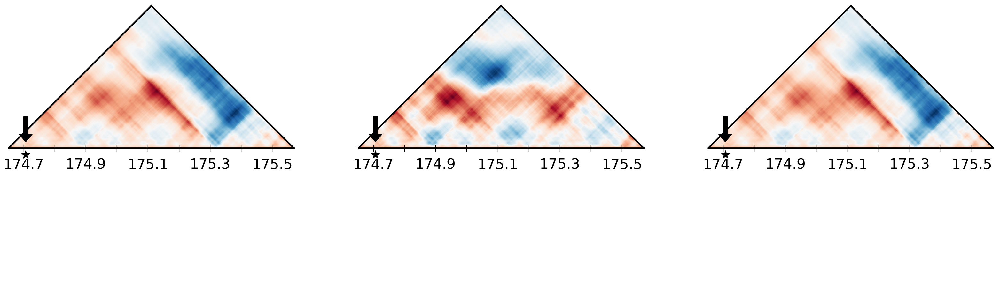

1/1 [==============================] - 1s 1s/step
174983739 0.0


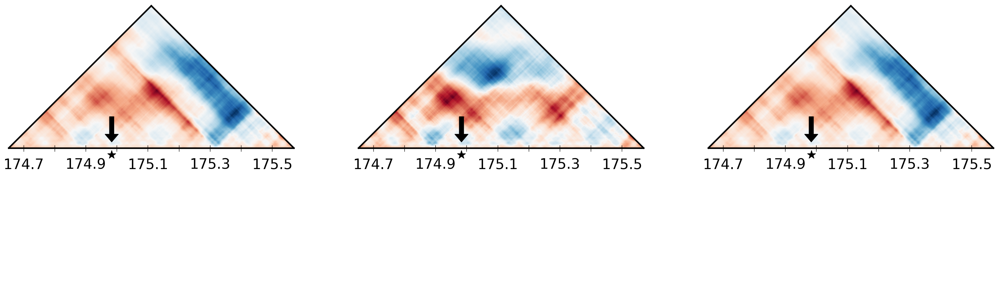

1/1 [==============================] - 2s 2s/step
174726535 0.0


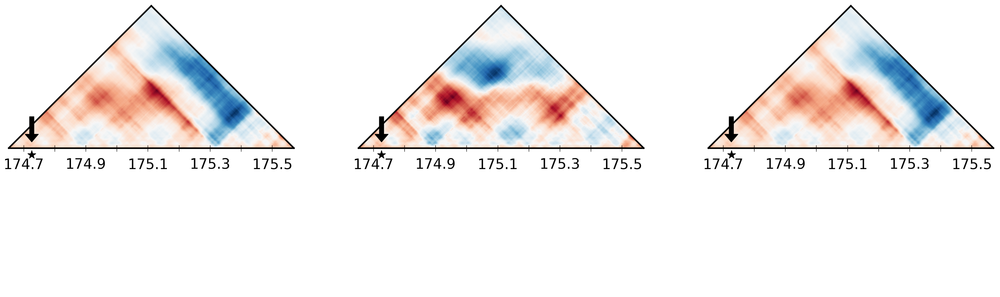

1/1 [==============================] - 1s 1s/step
174674773 0.0


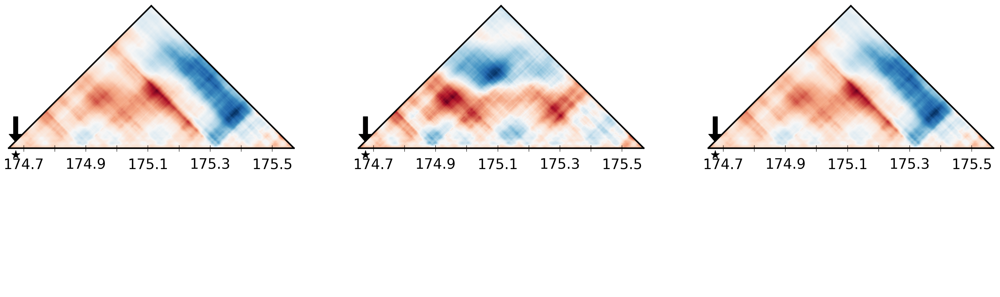

/scratch/egilbertson/ipykernel_28542/1206892173.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]


A
1048576
A
1048576
A
1048576
T
1048576
C
1048576
T
1048576
G
1048576
T
1048576
A
1048576
A
1048576
C
1048576
A
1048576
G
1048576
G
1048576
T
1048576
T
1048576
T
1048576
1/1 [==============================] - 1s 1s/step


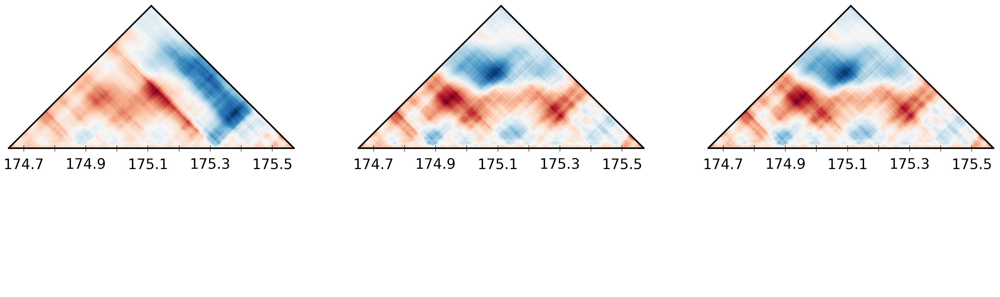

divergence ref:mut = 8.120040456172095e-05
divergence ref:ind = 0.5580111945043651
num variants: 17


/scratch/egilbertson/ipykernel_28542/1206892173.py:33: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))
/scratch/egilbertson/ipykernel_28542/1206892173.py:34: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)


,chr,pos,window,ref,alt,mse,1-pearson,1-spearman
378824,chr3,175488957,174587904,T,A,5.516477e-07,4.655346e-05,5.781490e-05
378807,chr3,174890509,174587904,G,A,1.657455e-07,1.495504e-05,1.388447e-05
378810,chr3,175173064,174587904,G,A,1.413975e-07,1.169806e-05,1.214591e-05
378820,chr3,175374359,174587904,G,T,3.444099e-08,3.094390e-06,3.313336e-06
378826,chr3,175545091,174587904,A,C,1.447784e-08,8.748148e-07,1.066024e-06
378814,chr3,175205059,174587904,C,T,1.109781e-08,1.014204e-06,1.040541e-06
378818,chr3,175348236,174587904,A,G,4.741622e-09,4.159412e-07,3.995199e-07
378804,chr3,174690960,174587904,C,T,2.853626e-09,2.491918e-07,2.843136e-07
378812,chr3,175201845,174587904,T,A,2.396565e-09,1.943581e-07,2.289851e-07
378802,chr3,174615321,174587904,G,A,2.424184e-09,2.087442e-07,2.049307e-07


In [ ]:
chrm = 'chr3'
wndw = 174587904
individual = 'SAS_BEB_female_HG04183'
pop = individual.split("_")[0]
id = individual.split("_")[3]

ref_seq = ref_fasta_open.fetch(chrm, int(wndw), int(wndw)+2**20).upper()
ref_pred = runAkitaPreds(ref_seq)
ref_pred = ref_pred[:,:,0][0]

ind_pred = load_1kg_map(chrm, wndw, individual)
ind_fasta_open = pysam.Fastafile('/wynton/group/capra/projects/modern_human_3Dgenome/data/genomes/1KG/%s/%s/%s_%s_hg38_full.fa' % (pop, individual, chrm, id))
ind_seq = ind_fasta_open.fetch(chrm, int(wndw), int(wndw)+2**20).upper()

for i in ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).index:
    allele_pos = ism.loc[i]['pos']
    ref_allele = ism.loc[i]['ref']
    ind_pred, mut_pred = get_contact_maps_custom_seqs(ind_seq, chrm, wndw, allele_pos, ref_allele)
    mse, divergence = comparePreds(np.array(ind_pred), np.array(mut_pred))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ind_pred, ref_pred, mut_pred, chrm, wndw, allele_pos, arrow_star = True)

a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=False, base_seq=ind_seq)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ind_pred, ref_pred, mut_pred, chrm, wndw, allele_pos, arrow_star = False)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))
ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)

In [ ]:
2**(17-1)

In [52]:
chrm

'chr3'

In [44]:
ism

,chr,pos,window,ref,alt,mse,1-pearson,1-spearman
0,chr1,3690011,3670016,C,A,9.003394e-10,1.514318e-09,4.639957e-09
1,chr1,3693115,3670016,C,T,9.365602e-09,7.348613e-09,8.825174e-09
2,chr1,3698789,3670016,G,A,2.326336e-08,4.651550e-08,8.821032e-08
3,chr1,3717495,3670016,G,A,1.444653e-07,2.427101e-07,6.393148e-07
4,chr1,3738085,3670016,G,A,3.781745e-09,5.331685e-09,1.061524e-08
...,...,...,...,...,...,...,...,...
622855,chr9,135110609,134217728,G,A,4.357696e-07,2.830572e-06,2.487266e-06
622856,chr9,135182081,134217728,G,A,7.254319e-10,4.901690e-09,5.869034e-09
622857,chr9,135195864,134217728,C,T,4.312340e-09,2.299801e-08,2.744629e-08
622858,chr9,135198156,134217728,C,T,3.394253e-09,1.799935e-08,2.175516e-08


## match with experimental data

In [235]:
idw_indivs = list(idw.id.unique())

In [236]:
exp_indivs = [
"NA18939",
"NA19650",
"NA20847",
"HG02011",
"HG00171",
"HG02492",
"HG03732",
"GM19833",
"NA19833",
"HG00733",
"NA19240",
"HG03009",
"HG01596",
"HG03371",
"HG01114",
"NA20509",
"HG01573",
"HG00864",
"HG03065",
"HG02018",
"HG02587",
"HG03683",
"NA12329",
"HG01505",
"HG00514",
"HG00096",
"NA19036",
"NA18534",
"HG00513",
"HG00512",
"HG00731",
"HG00732",
"NA19238",
"NA19239",
"NA18486",
"NA18505",
"NA18507",
"NA18508",
"NA18516",
"NA18522",
"NA19099",
"NA19141",
"NA19193",
"NA19204",
]

In [237]:
list(set(idw_indivs) &  set(exp_indivs))

['HG00864']

In [238]:
idw[idw.id == 'HG00864']

,C0,C1,C2,C3,C4,C5,depth,individual,chr,window,num_vars,super_pop,sub_pop,sex,id
"(chr4, 27262976)",1.0,129.0,0.0,0.0,0.0,0.0,0.020040,EAS_CDX_female_HG00864,chr4,27262976,17,EAS,CDX,female,HG00864
"(chr7, 96468992)",1.0,127.0,2.0,0.0,0.0,0.0,0.003293,EAS_CDX_female_HG00864,chr7,96468992,15,EAS,CDX,female,HG00864
"(chr13, 78118912)",1.0,120.0,9.0,0.0,0.0,0.0,0.024901,EAS_CDX_female_HG00864,chr13,78118912,32,EAS,CDX,female,HG00864
"(chr13, 90701824)",1.0,26.0,103.0,0.0,0.0,0.0,0.017680,EAS_CDX_female_HG00864,chr13,90701824,15,EAS,CDX,female,HG00864
"(chr16, 25690112)",1.0,129.0,0.0,0.0,0.0,0.0,0.040807,EAS_CDX_female_HG00864,chr16,25690112,17,EAS,CDX,female,HG00864
"(chr18, 77594624)",1.0,129.0,0.0,0.0,0.0,0.0,0.042488,EAS_CDX_female_HG00864,chr18,77594624,12,EAS,CDX,female,HG00864


In [239]:
vcf_index[vcf_index.id == 'HG00864']

,level_0,name,super,sub,sex,id,index,0
16,55,EAS_CDX_female_HG00864,EAS,CDX,female,HG00864,326,HG00864


In [240]:
27262976 + 2**20

28311552

/scratch/egilbertson/ipykernel_28542/2321494467.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for i in ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False).index:


chr4
27262976
1/1 [==============================] - 2s 2s/step
27818420 0.01556028309243851


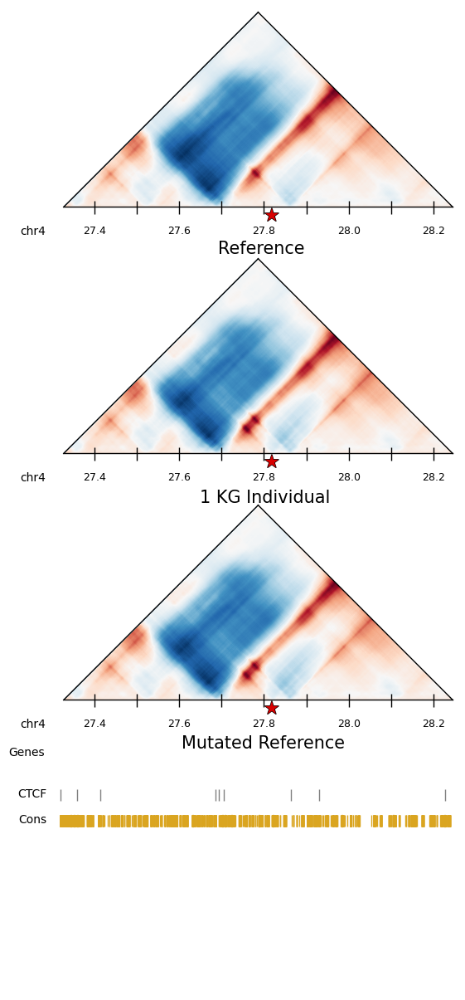

/scratch/egilbertson/ipykernel_28542/2321494467.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]


G
1048576
A
1048576
C
1048576
G
1048576
C
1048576
G
1048576
C
1048576
G
1048576
G
1048576
C
1048576
T
1048576
T
1048576
G
1048576
A
1048576
T
1048576
G
1048576
G
1048576
1/1 [==============================] - 1s 1s/step


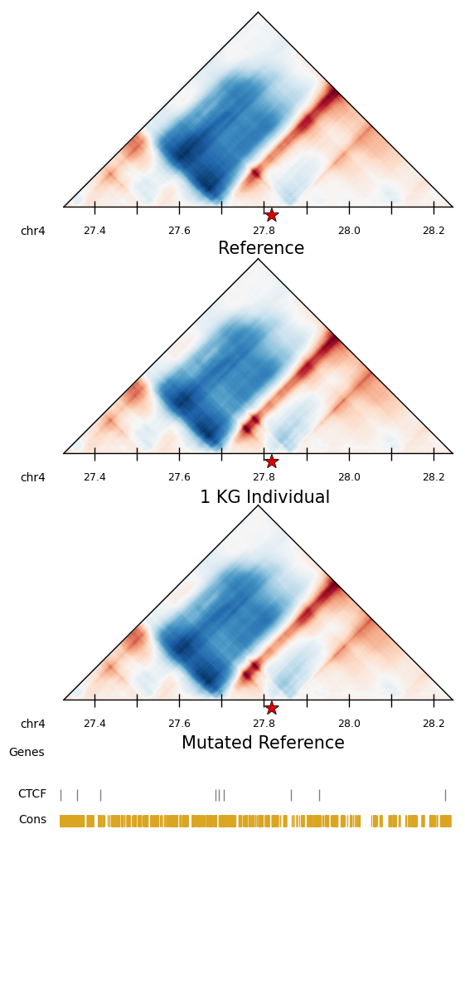

divergence ref:mut = 0.014947617559759818
divergence ref:ind = 0.11234216036603117
num variants: 17


/scratch/egilbertson/ipykernel_28542/2321494467.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))


In [242]:
chrm = 'chr4'
wndw = 27262976
individual = 'EAS_CDX_female_HG00864'

ind_pred = load_1kg_map(chrm, wndw, individual)
for i in ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False).index:
    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))

/scratch/egilbertson/ipykernel_28542/1684560923.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for i in ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False).index:


chr7
96468992
1/1 [==============================] - 2s 2s/step
96770875 0.0022313639008476605


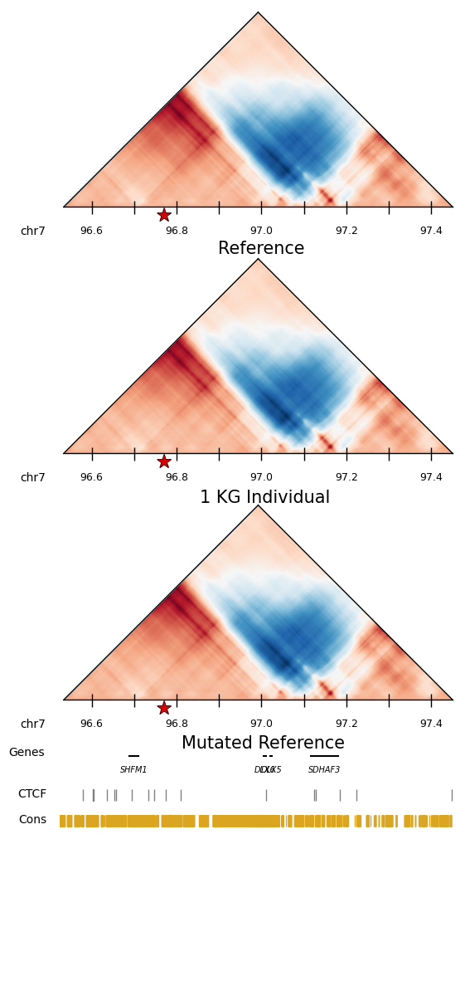

/scratch/egilbertson/ipykernel_28542/1684560923.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]


C
1048576
A
1048576
A
1048576
A
1048576
C
1048576
G
1048576
T
1048576
T
1048576
C
1048576
T
1048576
A
1048576
T
1048576
A
1048576
G
1048576
T
1048576
1/1 [==============================] - 1s 1s/step


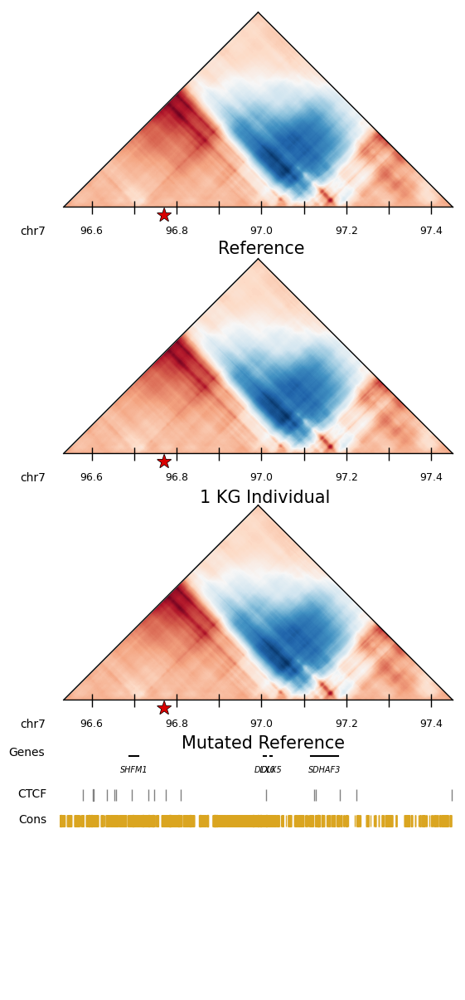

divergence ref:mut = 0.0021999931887410895
divergence ref:ind = 0.09893772815213941
num variants: 15


/scratch/egilbertson/ipykernel_28542/1684560923.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))


In [243]:
chrm = 'chr7'
wndw = 96468992
individual = 'EAS_CDX_female_HG00864'

ind_pred = load_1kg_map(chrm, wndw, individual)
for i in ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False).index:
    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))

/scratch/egilbertson/ipykernel_28542/249891659.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for i in ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False).index:


chr13
78118912
1/1 [==============================] - 2s 2s/step
78586830 0.009582469168321395


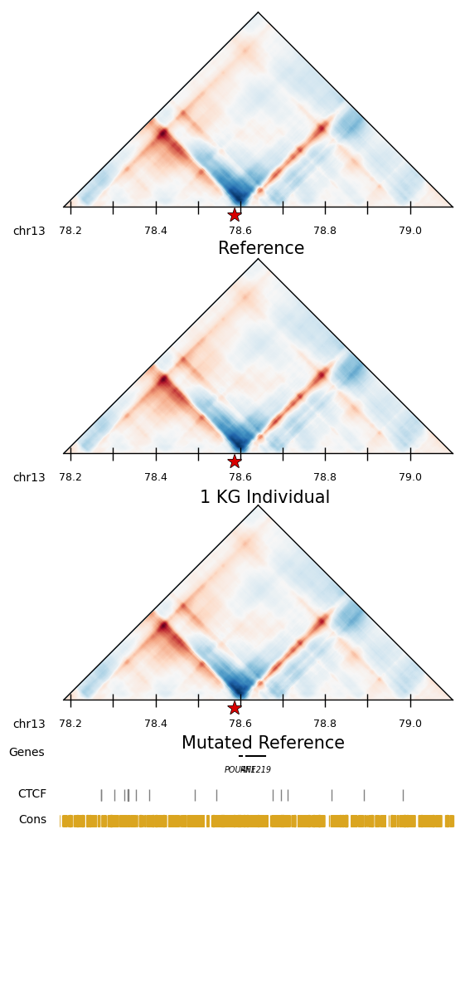

/scratch/egilbertson/ipykernel_28542/249891659.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]


T
1048576
T
1048576
T
1048576
T
1048576
A
1048576
G
1048576
G
1048576
G
1048576
C
1048576
G
1048576
T
1048576
C
1048576
G
1048576
A
1048576
G
1048576
C
1048576
A
1048576
C
1048576
A
1048576
A
1048576
C
1048576
C
1048576
A
1048576
T
1048576
C
1048576
A
1048576
T
1048576
A
1048576
G
1048576
A
1048576
A
1048576
G
1048576
1/1 [==============================] - 2s 2s/step


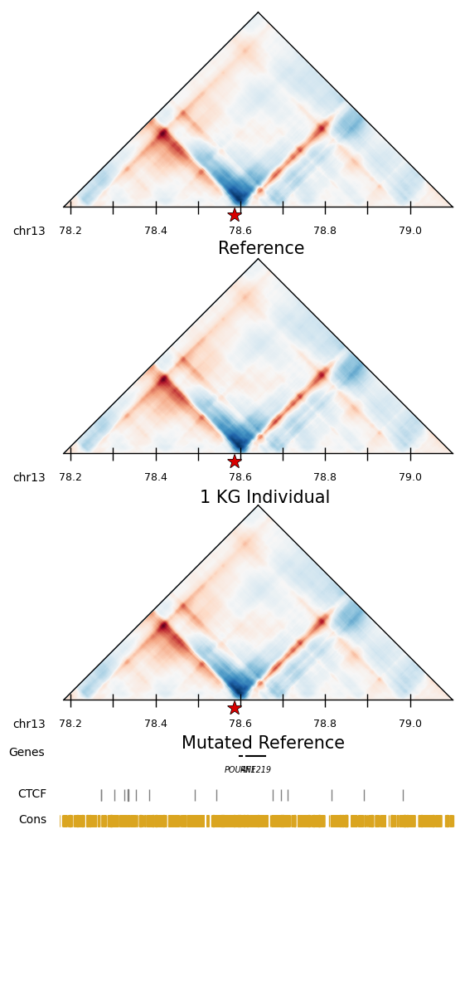

divergence ref:mut = 0.009128970199761999
divergence ref:ind = 0.09498031148307806
num variants: 32


/scratch/egilbertson/ipykernel_28542/249891659.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))


In [244]:
chrm = 'chr13'
wndw = 78118912
individual = 'EAS_CDX_female_HG00864'

ind_pred = load_1kg_map(chrm, wndw, individual)
for i in ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False).index:
    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))

/scratch/egilbertson/ipykernel_33288/1551869410.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for i in ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).index[0:5]:


chr13
90701824
1/1 [==============================] - 1s 1s/step
91504808 6.292596744783552e-07


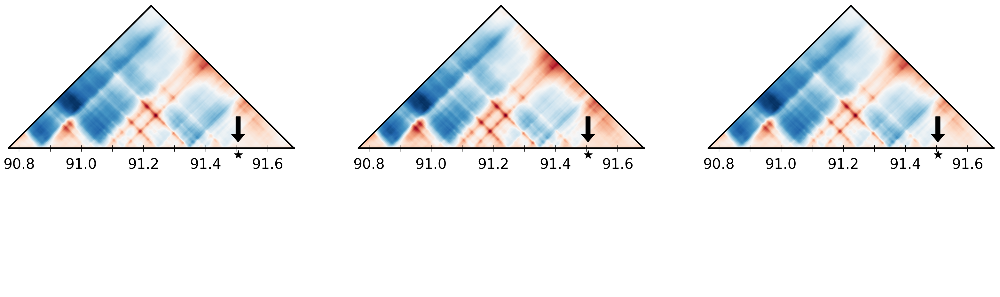

KeyboardInterrupt: 

In [ ]:
chrm = 'chr13'
wndw = 90701824
individual = 'EAS_CDX_female_HG00864'

ind_pred = load_1kg_map(chrm, wndw, individual)
for i in ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False).index:
    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))

In [ ]:
chrm = 'chr16'
wndw = 25690112
individual = 'EAS_CDX_female_HG00864'

ind_pred = load_1kg_map(chrm, wndw, individual)
for i in ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False).index:
    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))

KeyboardInterrupt: 

/scratch/egilbertson/ipykernel_33288/2811295614.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for i in ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).index[0:5]:


chr18
77594624
1/1 [==============================] - 1s 1s/step
78110548 3.4160602027766274e-05


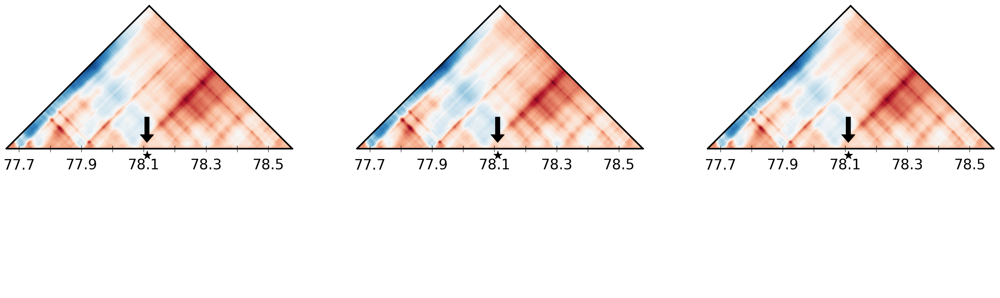

KeyboardInterrupt: 

In [ ]:
chrm = 'chr18'
wndw = 77594624
individual = 'EAS_CDX_female_HG00864'

ind_pred = load_1kg_map(chrm, wndw, individual)
for i in ism[ism.chr==chrm][ism.window==wndw][ism['1-spearman']>0.001].sort_values(by='1-spearman', ascending=False).index:
    allele_pos = ism.loc[i]['pos']
    alt_allele = ism.loc[i]['alt']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False)[['pos','alt']]

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % (ism[ism.chr==chrm][ism.window==wndw].sort_values(by='1-spearman', ascending=False).shape[0]))

In [ ]:
ref_div

AFR                                          \
                           ACB                                           
                        female                                           
                       HG01880   HG01883   HG01886   HG01889   HG01894   
chr   windowStartPos                                                     
chr1  1048576         0.001887  0.002376  0.002090  0.002764  0.005446   
      1572864         0.001455  0.002149  0.002353  0.002451  0.006055   
      3145728         0.005796  0.005204  0.005573  0.008185  0.004474   
      3670016         0.002717  0.002889  0.008788  0.005876  0.003651   
      4194304         0.001733  0.003498  0.007328  0.007026  0.004076   
...                        ...       ...       ...       ...       ...   
chr22 46661632        0.009996  0.002464  0.008487  0.015501  0.003501   
      47185920        0.031880  0.004652  0.002002  0.042038  0.004407   
      47710208        0.031723  0.038461  0.058351  0.115267  0.022607   
      48234496        0.190171  0.201378  0.247603  0.335508  0.209896   
      48758784        0.011144  0.019188  0.009220  0.022198  0.020404   

                                                                        ...  \
                                                                        ...   
                                                                        ...   
                       HG01896   HG01915   HG01956   HG01958   HG01985  ...   
chr   windowStartPos                                                    ...   
chr1  1048576         0.002805  0.002136  0.001302  0.003039  0.003233  ...   
      1572864         0.003397  0.002525  0.002937  0.007916  0.004073  ...   
      3145728         0.004200  0.005482  0.005160  0.005465  0.003913  ...   
      3670016         0.005854  0.002427  0.002797  0.001939  0.004082  ...   
      4194304         0.007798  0.001625  0.002338  0.001345  0.005976  ...   
...                        ...       ...       ...       ...       ...  ...   
chr22 46661632        0.006056  0.006623  0.013751  0.003791  0.018544  ...   
      47185920        0.012663  0.001999  0.011571  0.005230  0.003504  ...   
      47710208        0.037339  0.038931  0.024375  0.032503  0.028956  ...   
      48234496        0.183877  0.191428  0.208325  0.176306  0.172264  ...   
      48758784        0.008924  0.014129  0.019617  0.009365  0.018164  ...   

                           EUR                                          \
                           TSI                                           
                          male                                           
                       NA20803   NA20805   NA20806   NA20809   NA20810   
chr   windowStartPos                                                     
chr1  1048576         0.001395  0.000946  0.000396  0.000567  0.000444   
      1572864         0.001940  0.000926  0.000442  0.000905  0.001561   
      3145728         0.009459  0.000372  0.005239  0.004078  0.006581   
      3670016         0.004636  0.000470  0.003616  0.005137  0.003400   
      4194304         0.005189  0.003027  0.005476  0.008026  0.003051   
...                        ...       ...       ...       ...       ...   
chr22 46661632        0.003487  0.005252  0.005585  0.007474  0.002792   
      47185920        0.001892  0.002239  0.002432  0.002149  0.002952   
      47710208        0.088722  0.085783  0.018514  0.087971  0.084742   
      48234496        0.275077  0.286976  0.137118  0.308026  0.291224   
      48758784        0.017196  0.014541  0.010587  0.013414  0.010629   

                                                                        
                                                                        
                                                                        
                       NA20811   NA20812   NA20814   NA20815   NA20827  
chr   windowStartPos                                                    
chr1  1048576         0.000

## all variants in windows

### setup

In [356]:
chr3_HG04183 = pd.read_table('%s/in_silico_mutagenesis/all_variants_few_windows/chr3_one_zero_genotypes.txt' % DATA_PATH, names =['chr','pos','ref','alt','status'])
chr3_HG04183['window'] = 174587904
chr3_HG04183['chr'] = 'chr' + chr3_HG04183['chr'].apply(str)
chr3_HG04183 = chr3_HG04183[chr3_HG04183.status>0].loc[chr3_HG04183['ref'].str.len() == 1].loc[chr3_HG04183['alt'].str.len() == 1][['chr','pos','ref','alt','window']]
chr3_HG04183.to_csv('%s/IDWs/chr3_HG04183_variants.txt' % DATA_PATH, sep='\t', header=None, index=False)


In [ ]:
chr3_HG04183 = chr3_HG04183.reset_index(drop=True)
chr3_HG04183[chr3_HG04183.pos==175288067]

,chr,pos,ref,alt,window
1203,chr3,175288067,C,T,174587904


In [ ]:
chr4_HG00864 = pd.read_table('%s/in_silico_mutagenesis/all_variants_few_windows/chr4_one_zero_genotypes.txt' % DATA_PATH, names =['chr','pos','ref','alt','status'])
chr4_HG00864['window'] = 27262976
chr4_HG00864['chr'] = 'chr' + chr4_HG00864['chr'].apply(str)
chr4_HG00864 = chr4_HG00864[chr4_HG00864.status>0].loc[chr4_HG00864['ref'].str.len() == 1].loc[chr4_HG00864['alt'].str.len() == 1][['chr','pos','ref','alt','window']]
chr4_HG00864.to_csv('%s/IDWs/chr4_HG00864_variants.txt' % DATA_PATH, sep='\t', header=None, index=False)


In [ ]:
chr4_HG00864 = chr4_HG00864.reset_index(drop=True)
chr4_HG00864[chr4_HG00864.pos==28251340]


,chr,pos,ref,alt,window
1680,chr4,28251340,A,G,27262976


In [ ]:
chr4_HG00864

,chr,pos,ref,alt,window
0,chr4,27264352,C,A,27262976
1,chr4,27266720,T,C,27262976
2,chr4,27266801,T,C,27262976
3,chr4,27267786,G,A,27262976
4,chr4,27268305,T,C,27262976
...,...,...,...,...,...
1835,chr4,28308603,G,A,27262976
1836,chr4,28308809,C,T,27262976
1837,chr4,28308927,A,T,27262976
1838,chr4,28310981,G,A,27262976


In [ ]:
chr14_HG02946 = pd.read_table('%s/in_silico_mutagenesis/all_variants_few_windows/chr14_one_zero_genotypes.txt' % DATA_PATH, names =['chr','pos','ref','alt','status'])
chr14_HG02946['window'] = 46137344
chr14_HG02946['chr'] = 'chr' + chr14_HG02946['chr'].apply(str)
chr14_HG02946 = chr14_HG02946[chr14_HG02946.status>0].loc[chr14_HG02946['ref'].str.len() == 1].loc[chr14_HG02946['alt'].str.len() == 1][['chr','pos','ref','alt','window']]
chr14_HG02946.to_csv('%s/IDWs/chr14_HG02946_variants.txt' % DATA_PATH, sep='\t', header=None, index=False)


In [ ]:
chr14_HG02946 = chr14_HG02946.reset_index(drop=True)
chr14_HG02946[chr14_HG02946.pos==46707124]

,chr,pos,ref,alt,window
1099,chr14,46707124,A,G,46137344


In [ ]:
chr14_HG02946

,chr,pos,ref,alt,window
0,chr14,46137491,T,A,46137344
1,chr14,46138599,T,C,46137344
2,chr14,46138871,T,C,46137344
3,chr14,46138932,G,T,46137344
4,chr14,46141118,C,A,46137344
...,...,...,...,...,...
1839,chr14,47180712,A,G,46137344
1840,chr14,47181718,A,G,46137344
1841,chr14,47183122,G,A,46137344
1842,chr14,47184018,C,T,46137344


### Chr3 174587904 - SAS_BEB_female_HG04183

In [62]:
all_vars = pd.read_table('%s/in_silico_mutagenesis/all_variants_few_windows/ism_scores_all_variants_chr3_HG04183.txt' % DATA_PATH)

In [63]:
all_vars['1-spearman'].describe()

count    1.632000e+03
mean     3.478268e-04
std      1.379687e-02
min      1.111965e-09
25%      2.256325e-07
50%      7.056471e-07
75%      2.326154e-06
max      5.573661e-01
Name: 1-spearman, dtype: float64

In [64]:
all_vars[all_vars['1-spearman']>.001]

,chr,pos,window,ref,alt,mse,1-pearson,1-spearman
681,chr3,174932140,174587904,G,A,0.000023,0.002029,0.002191
736,chr3,174979548,174587904,G,A,0.000012,0.001094,0.001245
1264,chr3,175318568,174587904,C,G,0.016305,0.688301,0.557366


In [65]:
chrm = 'chr3'
wndw = 174587904
individual = 'SAS_BEB_female_HG04183'

ind_pred = load_1kg_map(chrm, wndw, individual)

for i in all_vars[all_vars['1-spearman']>.001].index:
    allele_pos = all_vars.loc[i]['pos']
    alt_allele = all_vars.loc[i]['alt']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = all_vars

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % all_vars.shape[0])

KeyboardInterrupt: 

In [67]:
ism[ism.chr==chrm][ism.pos==175318568]

/scratch/egilbertson/ipykernel_13288/428849851.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ism[ism.chr==chrm][ism.pos==175318568]


,chr,pos,window,ref,alt,mse,1-pearson,1-spearman


### Chr14 46137344 - AFR_ESN_female_HG02946

In [447]:
all_vars = pd.read_table('%s/in_silico_mutagenesis/all_variants_few_windows/ism_scores_all_variants_chr14_HG02946.txt' % DATA_PATH)

In [448]:
all_vars['1-spearman'].describe()

count    1.844000e+03
mean     2.044919e-04
std      8.508896e-03
min      2.225504e-09
25%      1.137196e-07
50%      3.385551e-07
75%      9.747496e-07
max      3.653548e-01
Name: 1-spearman, dtype: float64

In [449]:
all_vars[all_vars['1-spearman']>.001]

,chr,pos,window,ref,alt,mse,1-pearson,1-spearman
383,chr14,46344692,46137344,C,G,0.000021,0.000774,0.001253
895,chr14,46581275,46137344,G,A,0.006225,0.310098,0.365355
1012,chr14,46651976,46137344,G,A,0.000117,0.003967,0.005101


chr14
46137344
1/1 [==============================] - 2s 2s/step
46344692 0.0012534710963894025


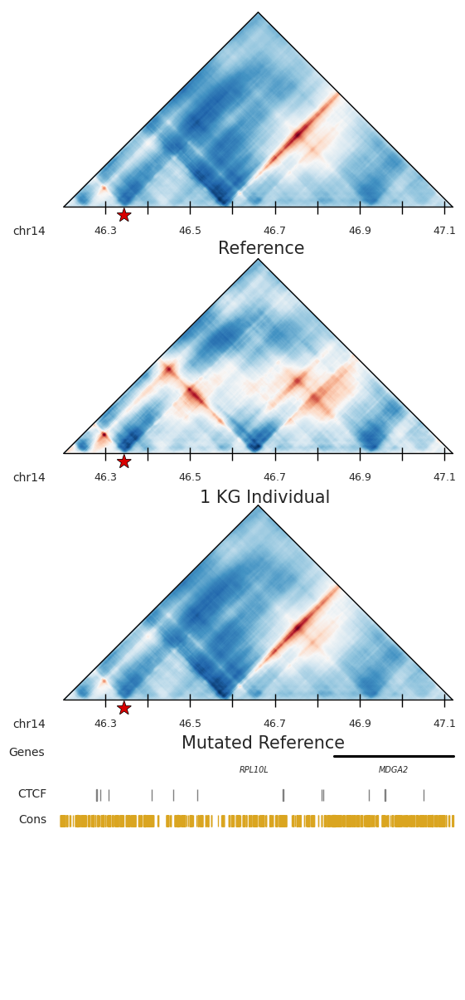

chr14
46137344
1/1 [==============================] - 3s 3s/step
46581275 0.36535478677978706


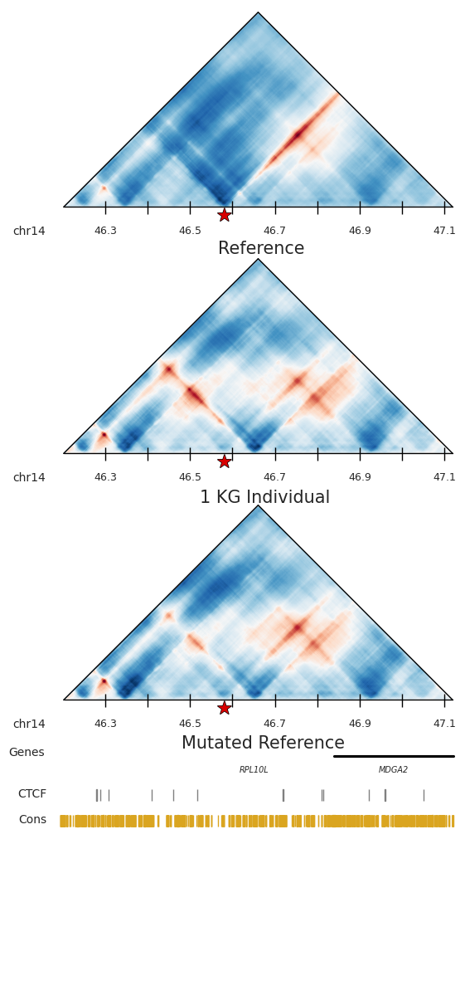

chr14
46137344
1/1 [==============================] - 2s 2s/step
46651976 0.00510120904770639


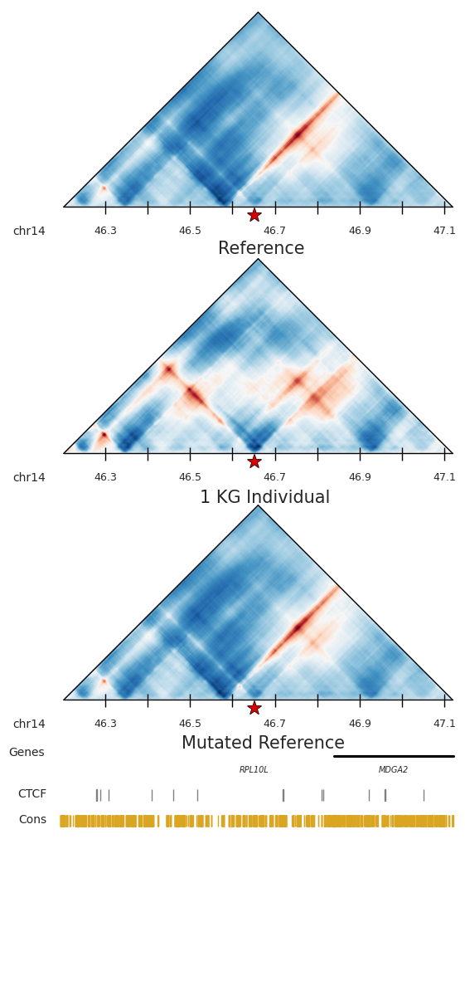

A
1048576
C
1048576
C
1048576
T
1048576
A
1048576
G
1048576
T
1048576
G
1048576
T
1048576
G
1048576
G
1048576
G
1048576
G
1048576
T
1048576
A
1048576
T
1048576
T
1048576
G
1048576
C
1048576
C
1048576
G
1048576
G
1048576
A
1048576
C
1048576
G
1048576
A
1048576
A
1048576
A
1048576
A
1048576
C
1048576
T
1048576
T
1048576
G
1048576
G
1048576
A
1048576
A
1048576
G
1048576
A
1048576
C
1048576
T
1048576
A
1048576
T
1048576
C
1048576
T
1048576
G
1048576
G
1048576
G
1048576
C
1048576
T
1048576
A
1048576
A
1048576
A
1048576
C
1048576
G
1048576
C
1048576
G
1048576
C
1048576
T
1048576
A
1048576
G
1048576
C
1048576
A
1048576
G
1048576
A
1048576
A
1048576
T
1048576
T
1048576
G
1048576
G
1048576
T
1048576
C
1048576
T
1048576
A
1048576
A
1048576
A
1048576
A
1048576
G
1048576
A
1048576
T
1048576
G
1048576
T
1048576
G
1048576
T
1048576
A
1048576
G
1048576
C
1048576
A
1048576
G
1048576
T
1048576
A
1048576
T
1048576
G
1048576
G
1048576
C
1048576
G
1048576
T
1048576
C
1048576
G
1048576
C
1048576
T
1048576


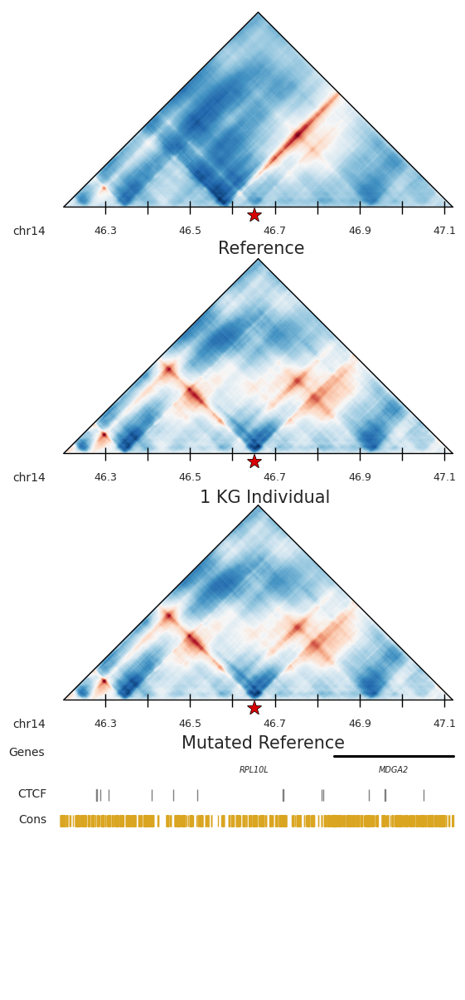

divergence ref:mut = 0.47107415863375923
divergence ref:ind = 0.591705713869465
num variants: 1844


In [450]:
chrm = 'chr14'
wndw = 46137344
individual = 'AFR_ESN_female_HG02946'

ind_pred = load_1kg_map(chrm, wndw, individual)

for i in all_vars[all_vars['1-spearman']>.001].index:
    allele_pos = all_vars.loc[i]['pos']
    alt_allele = all_vars.loc[i]['alt']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = all_vars

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % all_vars.shape[0])

### Chr4 27262976 - EAS_CDX_female_HG00864

In [451]:
all_vars = pd.read_table('%s/in_silico_mutagenesis/all_variants_few_windows/ism_scores_all_variants_chr4_HG00864.txt' % DATA_PATH)

In [452]:
all_vars['1-spearman'].describe()

count    1.840000e+03
mean     8.750960e-06
std      3.627457e-04
min      5.116620e-10
25%      2.214522e-08
50%      5.956194e-08
75%      1.920762e-07
max      1.556023e-02
Name: 1-spearman, dtype: float64

In [453]:
all_vars[all_vars['1-spearman']>.001]

,chr,pos,window,ref,alt,mse,1-pearson,1-spearman
821,chr4,27818420,27262976,T,G,0.001827,0.010612,0.01556


In [454]:
gene_starts, gene_lengths, gene_midpoints, exon_genes, phastCons_starts, phastCons_lengths, CTCF_starts, CTCF_lengths = annotations(chrm, wndw)


chr4
27262976
1/1 [==============================] - 3s 3s/step
27818420 0.01556028309243851


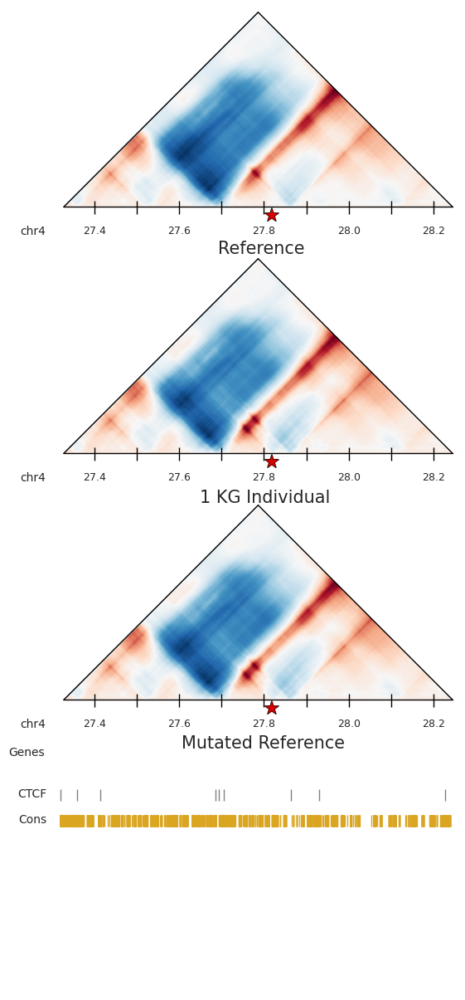

A
1048576
C
1048576
C
1048576
A
1048576
C
1048576
G
1048576
A
1048576
G
1048576
C
1048576
C
1048576
T
1048576
A
1048576
C
1048576
T
1048576
C
1048576
G
1048576
G
1048576
G
1048576
A
1048576
G
1048576
G
1048576
A
1048576
G
1048576
T
1048576
T
1048576
G
1048576
G
1048576
T
1048576
G
1048576
G
1048576
A
1048576
C
1048576
T
1048576
A
1048576
C
1048576
A
1048576
C
1048576
G
1048576
T
1048576
T
1048576
C
1048576
G
1048576
C
1048576
C
1048576
T
1048576
A
1048576
T
1048576
C
1048576
A
1048576
T
1048576
C
1048576
A
1048576
G
1048576
A
1048576
A
1048576
G
1048576
G
1048576
T
1048576
T
1048576
C
1048576
A
1048576
A
1048576
A
1048576
A
1048576
G
1048576
A
1048576
C
1048576
T
1048576
C
1048576
G
1048576
A
1048576
T
1048576
T
1048576
A
1048576
G
1048576
G
1048576
A
1048576
T
1048576
T
1048576
T
1048576
T
1048576
A
1048576
A
1048576
G
1048576
A
1048576
A
1048576
A
1048576
A
1048576
T
1048576
A
1048576
T
1048576
C
1048576
A
1048576
T
1048576
A
1048576
T
1048576
C
1048576
G
1048576
C
1048576
T
1048576


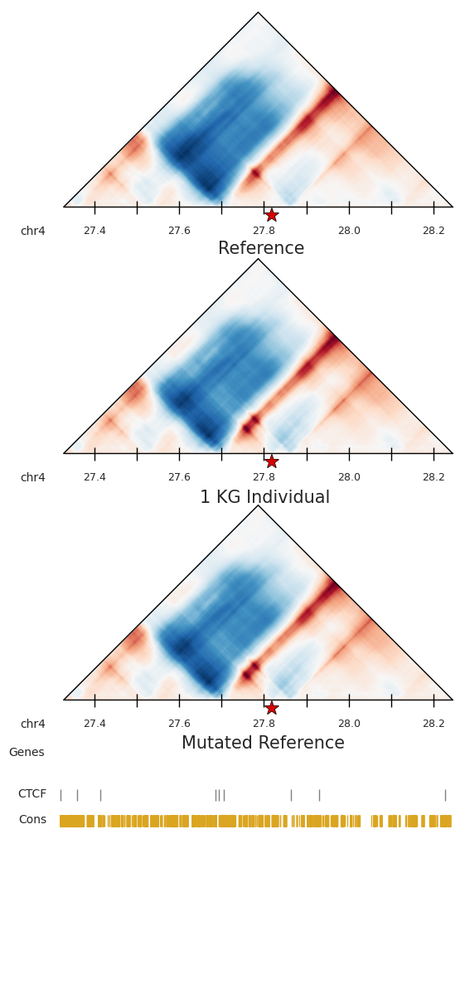

divergence ref:mut = 0.012466706416236262
divergence ref:ind = 0.11234216036603117
num variants: 1840


In [455]:
chrm = 'chr4'
wndw = 27262976
individual = 'EAS_CDX_female_HG00864'

ind_pred = load_1kg_map(chrm, wndw, individual)

for i in all_vars[all_vars['1-spearman']>.001].index:
    allele_pos = all_vars.loc[i]['pos']
    alt_allele = all_vars.loc[i]['alt']
    mse, divergence, ref_pred, mut_pred = in_silico_mutagenesis_SNV_test(chrm,allele_pos,alt_allele, (chrm + '_' + str(wndw)))
    print(allele_pos, divergence)
    map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)

a = all_vars

muts = list(zip(a.pos, a.alt))
mut_seq = get_mut_seq(muts, wndw, ref=True)
mut_pred = runAkitaPreds(mut_seq)
mut_pred = mut_pred[:,:,0][0]

map_comparison_IDW_prediction(ref_pred, ind_pred, mut_pred, chrm, wndw, allele_pos)
print('divergence ref:mut = %s' % (1 - stats.spearmanr(ref_pred, mut_pred)[0]))
print('divergence ref:ind = %s' % (1 - stats.spearmanr(ref_pred, ind_pred)[0]))
print('num variants: %s' % all_vars.shape[0])

In [393]:
genes = pd.read_csv('/wynton/group/capra/projects/modern_human_3Dgenome/data/annotations/grch38_gene_annotations.bed', sep = '\t', header = None, names = ['chr','start','end','gene'], skiprows=1)


In [395]:
genes[genes.chr=='chr4'][genes.start>wndw][genes.start<wndw+2**20]

/scratch/egilbertson/ipykernel_3566/3924742411.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  genes[genes.chr=='chr4'][genes.start>wndw][genes.start<wndw+2**20]


,chr,start,end,gene


In [400]:
genes[genes.chr=='chr4'][genes.end < wndw+2**20]

/scratch/egilbertson/ipykernel_3566/1508912416.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  genes[genes.chr=='chr4'][genes.end < wndw+2**20]


,chr,start,end,gene
4213,chr4,270674,305321,ZNF732
4214,chr4,337834,375258,ZNF141
4215,chr4,441694,499156,ZNF721
4216,chr4,499220,539529,PIGG
4217,chr4,625605,670753,PDE6B
...,...,...,...,...
4370,chr4,25914203,25929812,SMIM20
4371,chr4,26319709,26435128,RBPJ
4372,chr4,26481399,26490462,CCKAR
4373,chr4,26583915,26755351,TBC1D19


In [398]:
wndw

27262976

In [147]:
for x in range(1,131):
    print(x)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
